# DCGAN

Followed this tutorial: https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

## Preliminary Stuff

In [13]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torchvision
import torch.nn as nn
import tensorflow as tf
import torch.nn.functional as F
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from prettytable import PrettyTable
from IPython.display import HTML

# for an easy format later
t = PrettyTable(['Trial', 'Accuracy', 'Time/Epoch', 'Initial Loss/Batch', 'Average Loss/Batch', 'Final Loss/Batch'])

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Assuming that we are on a CUDA machine, this should print a CUDA device:

print(device)

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

cuda:0
Random Seed:  999


In [14]:
# Root directory for dataset
dataroot = './data'

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 2

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [15]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [16]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu

        
        if image_size == 32:
            self.main = nn.Sequential(
                # input is Z, going into a convolution
                nn.ConvTranspose2d( nz, ngf * 4, 4, 1, 0, bias=False),
                nn.BatchNorm2d(ngf * 4),
                nn.ReLU(True),
                # state size. (ngf*4) x 8 x 8
                nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 2),
                nn.ReLU(True),
                # state size. (ngf*2) x 16 x 16
                nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf),
                nn.ReLU(True),
                # state size. (ngf) x 32 x 32
                nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
                nn.Tanh()
                # state size. (nc) x 64 x 64
            )
                

        elif image_size == 64:
            self.main = nn.Sequential(
                # input is Z, going into a convolution
                nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
                nn.BatchNorm2d(ngf * 8),
                nn.ReLU(True),
                # state size. (ngf*8) x 4 x 4
                nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 4),
                nn.ReLU(True),
                # state size. (ngf*4) x 8 x 8
                nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 2),
                nn.ReLU(True),
                # state size. (ngf*2) x 16 x 16
                nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf),
                nn.ReLU(True),
                # state size. (ngf) x 32 x 32
                nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
                nn.Tanh()
                # state size. (nc) x 64 x 64
            )
                
        elif image_size == 128:
            self.main = nn.Sequential(
                # input is Z, going into a convolution
                nn.ConvTranspose2d( nz, ngf * 16, 4, 1, 0, bias=False),
                nn.BatchNorm2d(ngf * 16),
                nn.ReLU(True),
                # state size. (ngf*16) x 4 x 4
                nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 8),
                nn.ReLU(True),
                # state size. (ngf*8) x 4 x 4
                nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 4),
                nn.ReLU(True),
                # state size. (ngf*4) x 8 x 8
                nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 2),
                nn.ReLU(True),
                # state size. (ngf*2) x 16 x 16
                nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf),
                nn.ReLU(True),
                # state size. (ngf) x 32 x 32
                nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
                nn.Tanh()
                # state size. (nc) x 64 x 64
            )
                
        elif image_size == 256:
            self.main = nn.Sequential(
                # input is Z, going into a convolution
                nn.ConvTranspose2d( nz, ngf *32, 4, 1, 0, bias=False),
                nn.BatchNorm2d(ngf * 32),
                nn.ReLU(True),
                # state size. (ngf*32) x 4 x 4
                nn.ConvTranspose2d(ngf * 32, ngf * 16, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 16),
                nn.ReLU(True),
                # state size. (ngf*16) x 4 x 4
                nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 8),
                nn.ReLU(True),
                # state size. (ngf*8) x 4 x 4
                nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 4),
                nn.ReLU(True),
                # state size. (ngf*4) x 8 x 8
                nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf * 2),
                nn.ReLU(True),
                # state size. (ngf*2) x 16 x 16
                nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ngf),
                nn.ReLU(True),
                # state size. (ngf) x 32 x 32
                nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
                nn.Tanh()
                # state size. (nc) x 64 x 64
            )
            

    def forward(self, input):
        return self.main(input)

In [17]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
    
        if image_size == 32:
            self.main = nn.Sequential(
                # input is (nc) x 64 x 64
                nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf) x 32 x 32
                nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 2),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*2) x 16 x 16
                nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 4),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*4) x 4 x 4
                nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
                nn.Sigmoid()

            )

        elif image_size ==  64:
            self.main = nn.Sequential(
                # input is (nc) x 64 x 64
                nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf) x 32 x 32
                nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 2),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*2) x 16 x 16
                nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 4),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*4) x 8 x 8
                nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 8),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*8) x 4 x 4
                nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
                nn.Sigmoid()

            )
        elif image_size ==  128:
            self.main = nn.Sequential(
                # input is (nc) x 64 x 64
                nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf) x 32 x 32
                nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 2),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*2) x 16 x 16
                nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 4),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*4) x 8 x 8
                nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 8),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*8) x 8 x 8
                nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 16),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*16) x 4 x 4
                nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
                nn.Sigmoid()

            )
        elif image_size ==  256:
            self.main = nn.Sequential(
                # input is (nc) x 64 x 64
                nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf) x 32 x 32
                nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 2),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*2) x 16 x 16
                nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 4),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*4) x 8 x 8
                nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 8),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*8) x 8 x 8
                nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 16),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*16) x 8 x 8
                nn.Conv2d(ndf * 16, ndf * 32, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 32),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*32) x 4 x 4
                nn.Conv2d(ndf * 32, 1, 4, 1, 0, bias=False),
                nn.Sigmoid()
            )
        

    def forward(self, input):
        return self.main(input)

Adding for changing image size

## CIFAR-10 Base

Files already downloaded and verified


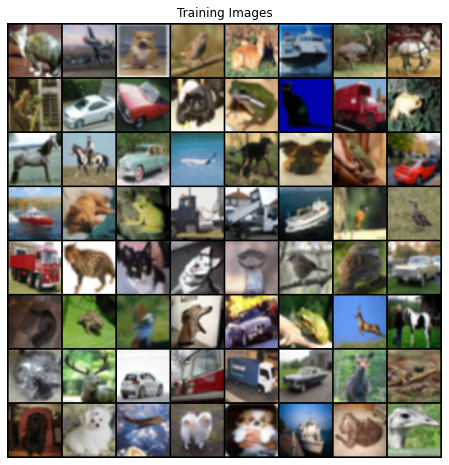

In [6]:
# Number of channels in the training images. For color images this is 3
nc = 3

dataset = torchvision.datasets.CIFAR10(root=dataroot, download=True,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [7]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [8]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [9]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [14]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/2][0/391]	Loss_D: 1.9132	Loss_G: 1.6793	D(x): 0.3804	D(G(z)): 0.0884 / 0.3363
[0/2][50/391]	Loss_D: 0.3365	Loss_G: 3.4871	D(x): 0.8776	D(G(z)): 0.1677 / 0.0415
[0/2][100/391]	Loss_D: 0.5880	Loss_G: 4.3762	D(x): 0.6300	D(G(z)): 0.0112 / 0.0203
[0/2][150/391]	Loss_D: 0.7629	Loss_G: 6.6395	D(x): 0.9232	D(G(z)): 0.4465 / 0.0030
[0/2][200/391]	Loss_D: 0.4359	Loss_G: 4.5024	D(x): 0.7495	D(G(z)): 0.0353 / 0.0189
[0/2][250/391]	Loss_D: 0.5547	Loss_G: 3.9465	D(x): 0.7701	D(G(z)): 0.2153 / 0.0263
[0/2][300/391]	Loss_D: 0.2765	Loss_G: 3.1046	D(x): 0.8883	D(G(z)): 0.1251 / 0.0639
[0/2][350/391]	Loss_D: 0.8139	Loss_G: 5.3755	D(x): 0.9159	D(G(z)): 0.4480 / 0.0082
[1/2][0/391]	Loss_D: 0.5686	Loss_G: 2.1035	D(x): 0.6744	D(G(z)): 0.0995 / 0.1584
[1/2][50/391]	Loss_D: 0.3105	Loss_G: 4.3408	D(x): 0.9188	D(G(z)): 0.1844 / 0.0198
[1/2][100/391]	Loss_D: 0.8116	Loss_G: 6.0765	D(x): 0.9005	D(G(z)): 0.4435 / 0.0046
[1/2][150/391]	Loss_D: 0.6719	Loss_G: 4.9803	D(x): 0.8701	D(G(z)): 

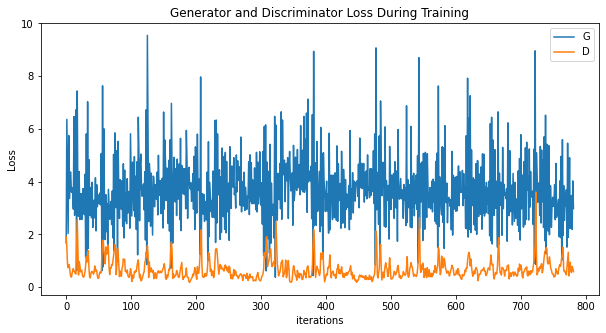

In [15]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


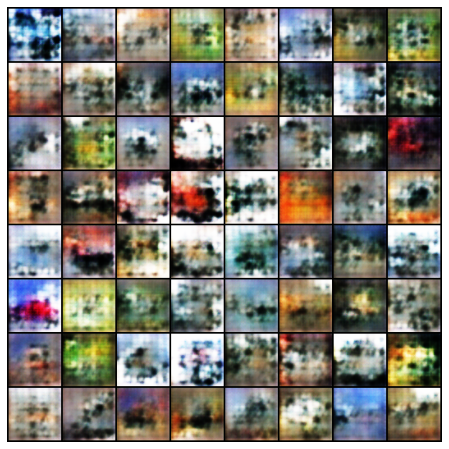

In [16]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

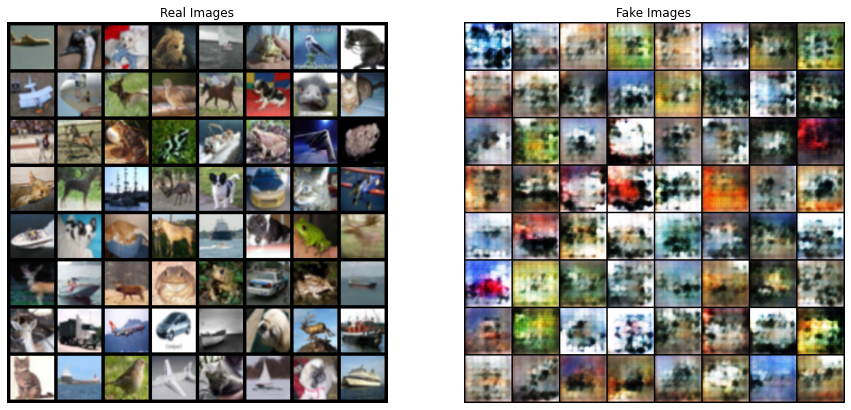

In [17]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

### Variations

Image Size

Files already downloaded and verified
Starting Training Loop...
[0/2][0/391]	Loss_D: 1.4545	Loss_G: 2.4362	D(x): 0.5935	D(G(z)): 0.5617 / 0.1028


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:143: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


[0/2][50/391]	Loss_D: 0.1749	Loss_G: 6.0482	D(x): 0.9136	D(G(z)): 0.0736 / 0.0032
[0/2][100/391]	Loss_D: 0.8531	Loss_G: 9.6799	D(x): 0.9498	D(G(z)): 0.5139 / 0.0003
[0/2][150/391]	Loss_D: 0.1527	Loss_G: 3.8966	D(x): 0.9301	D(G(z)): 0.0679 / 0.0287
[0/2][200/391]	Loss_D: 0.1452	Loss_G: 6.7763	D(x): 0.9569	D(G(z)): 0.0907 / 0.0016
[0/2][250/391]	Loss_D: 0.3767	Loss_G: 4.1976	D(x): 0.8099	D(G(z)): 0.0802 / 0.0274
[0/2][300/391]	Loss_D: 0.8514	Loss_G: 4.1316	D(x): 0.7944	D(G(z)): 0.3993 / 0.0243
[0/2][350/391]	Loss_D: 0.2750	Loss_G: 4.3798	D(x): 0.8355	D(G(z)): 0.0685 / 0.0175
[1/2][0/391]	Loss_D: 0.6399	Loss_G: 5.6280	D(x): 0.8122	D(G(z)): 0.2777 / 0.0061
[1/2][50/391]	Loss_D: 0.3629	Loss_G: 5.0327	D(x): 0.8336	D(G(z)): 0.1303 / 0.0129
[1/2][100/391]	Loss_D: 0.2929	Loss_G: 4.2985	D(x): 0.8865	D(G(z)): 0.1301 / 0.0211
[1/2][150/391]	Loss_D: 0.4797	Loss_G: 4.8514	D(x): 0.8470	D(G(z)): 0.2171 / 0.0149
[1/2][200/391]	Loss_D: 0.2314	Loss_G: 5.2860	D(x): 0.8312	D(G(z)): 0.0159 / 0.0093
[1/2][25

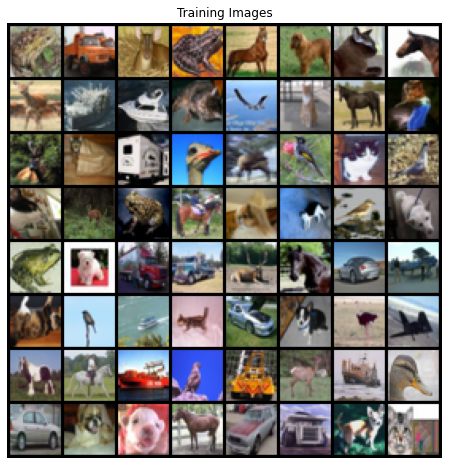

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

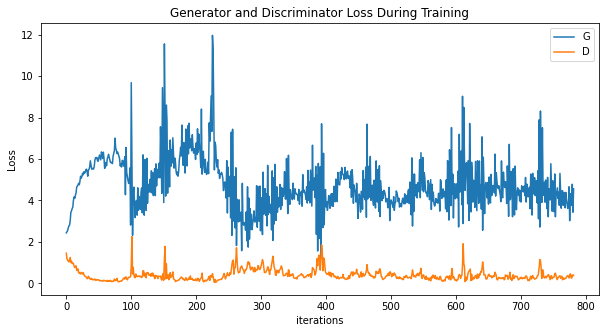

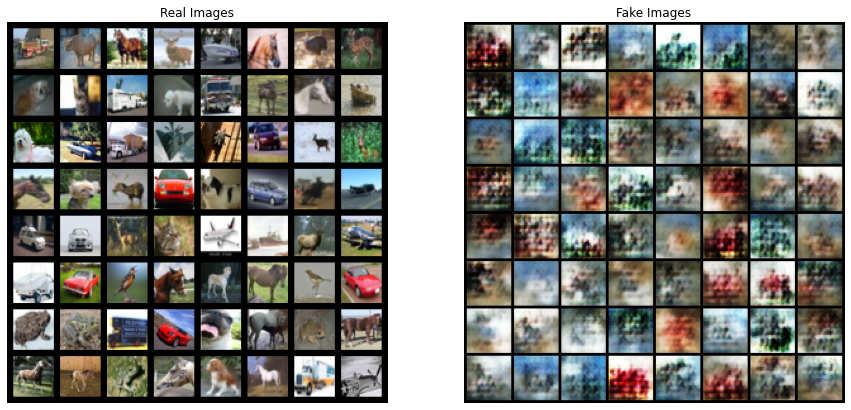

Files already downloaded and verified
Starting Training Loop...
[0/2][0/391]	Loss_D: 2.7571	Loss_G: 51.1977	D(x): 0.5975	D(G(z)): 0.6567 / 0.0000
[0/2][50/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][100/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][150/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][200/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][250/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][300/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][350/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[1/2][0/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[1/2][50/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[1/2][100/391]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[1/2][15

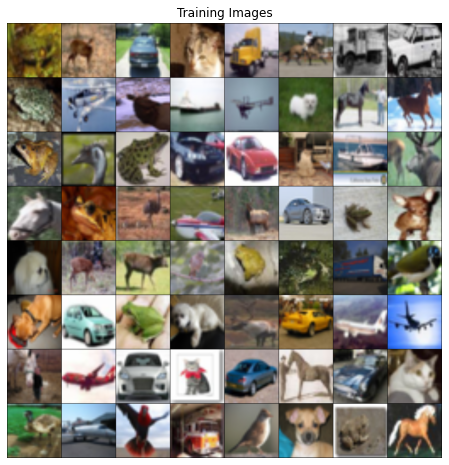

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

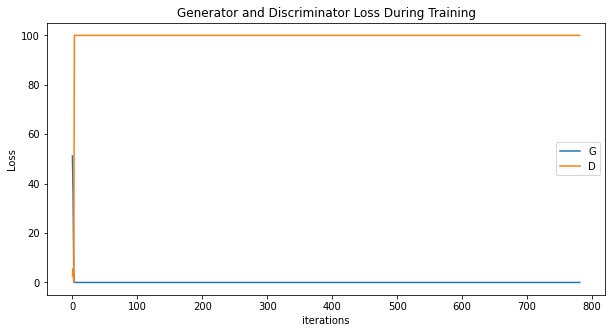

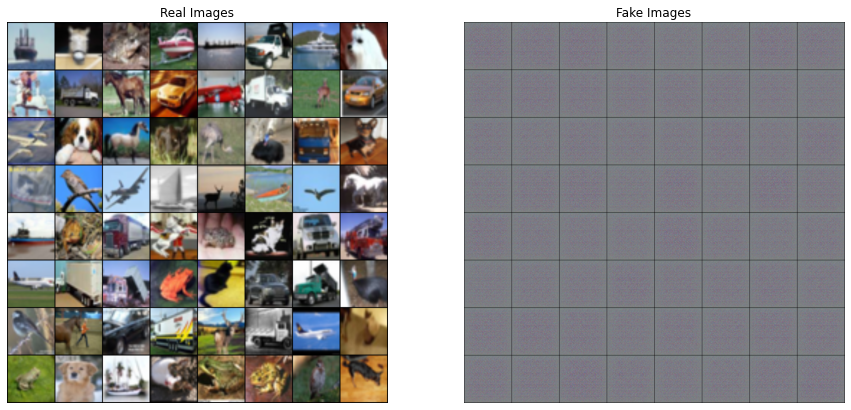

Files already downloaded and verified
Starting Training Loop...
[0/2][0/391]	Loss_D: 1.8203	Loss_G: 13.1157	D(x): 0.4711	D(G(z)): 0.4524 / 0.0000
[0/2][50/391]	Loss_D: 0.0006	Loss_G: 43.6009	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[0/2][100/391]	Loss_D: 0.0001	Loss_G: 42.9924	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[0/2][150/391]	Loss_D: 0.0001	Loss_G: 43.0647	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[0/2][200/391]	Loss_D: 0.0000	Loss_G: 42.8458	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[0/2][250/391]	Loss_D: 0.0000	Loss_G: 42.4421	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[0/2][300/391]	Loss_D: 0.0001	Loss_G: 42.3402	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[0/2][350/391]	Loss_D: 0.0000	Loss_G: 42.1148	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1/2][0/391]	Loss_D: 0.0000	Loss_G: 42.2623	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1/2][50/391]	Loss_D: 0.0001	Loss_G: 42.0550	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[1/2][100/391]	Loss_D: 0.0000	Loss_G: 41.3269	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1/2][150/391]	Los

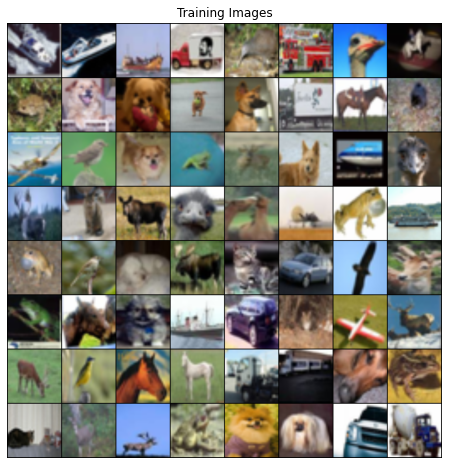

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

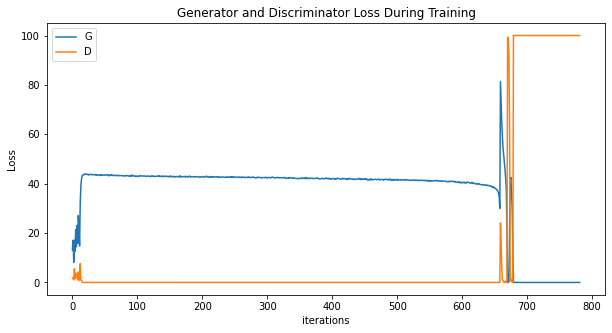

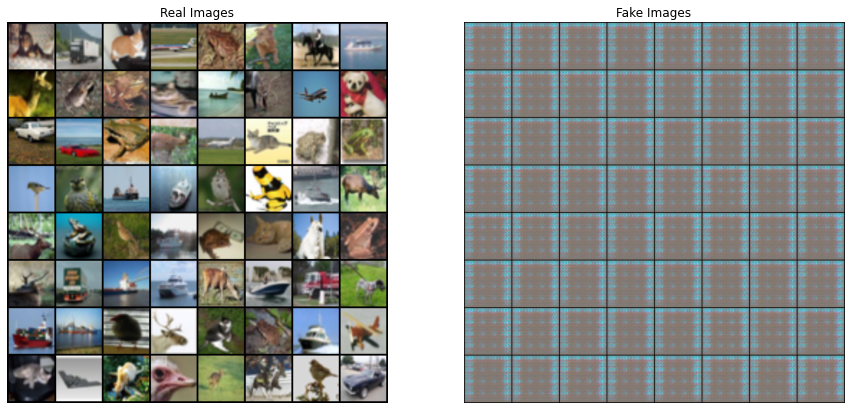

In [18]:
# Spatial size of training images. All images will be resized to this
#   size using a transformer.
for image_size in {32,128,256}:
    dataset = torchvision.datasets.CIFAR10(root=dataroot, download=True,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
    # Create the dataloader
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                            shuffle=True, num_workers=workers)

    # Decide which device we want to run on
    device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

    # Plot some training images
    real_batch = next(iter(dataloader))
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title("Training Images")
    plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
    # Create the generator
    netG = Generator(ngpu).to(device)

    # Handle multi-gpu if desired
    if (device.type == 'cuda') and (ngpu > 1):
        netG = nn.DataParallel(netG, list(range(ngpu)))

    # Apply the weights_init function to randomly initialize all weights
    #  to mean=0, stdev=0.2.
    netG.apply(weights_init)

    # Create the Discriminator
    netD = Discriminator(ngpu).to(device)

    # Handle multi-gpu if desired
    if (device.type == 'cuda') and (ngpu > 1):
        netD = nn.DataParallel(netD, list(range(ngpu)))

    # Apply the weights_init function to randomly initialize all weights
    #  to mean=0, stdev=0.2.
    netD.apply(weights_init)

    # Initialize BCELoss function
    criterion = nn.BCELoss()

    # Create batch of latent vectors that we will use to visualize
    #  the progression of the generator
    fixed_noise = torch.randn(64, nz, 1, 1, device=device)

    # Establish convention for real and fake labels during training
    real_label = 1.
    fake_label = 0.

    # Setup Adam optimizers for both G and D
    optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
    optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

    # Training Loop

    # Lists to keep track of progress
    img_list = []
    G_losses = []
    D_losses = []
    iters = 0

    print("Starting Training Loop...")
    # For each epoch
    for epoch in range(num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            ## Train with all-real batch
            netD.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            # Forward pass real batch through D
            output = netD(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = criterion(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()

            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            # Generate fake image batch with G
            fake = netG(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output, label)
            # Calculate the gradients for this batch
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-fake batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            netG.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = netD(fake).view(-1)
            # Calculate G's loss based on this output
            errG = criterion(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()

            # Output training stats
            if i % 50 == 0:
                print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                    % (epoch, num_epochs, i, len(dataloader),
                        errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                    fake = netG(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            iters += 1

            plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    # Grab a batch of real images from the dataloader
    real_batch = next(iter(dataloader))

    # Plot the real images
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.axis("off")
    plt.title("Real Images")
    plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

    # Plot the fake images from the last epoch
    plt.subplot(1,2,2)
    plt.axis("off")
    plt.title("Fake Images")
    plt.imshow(np.transpose(img_list[-1],(1,2,0)))
    plt.show()


Model Architectures

## MNIST Base

Starting Training Loop...
[0/2][0/469]	Loss_D: 1.7934	Loss_G: 2.0034	D(x): 0.3053	D(G(z)): 0.2772 / 0.1756
[0/2][50/469]	Loss_D: 0.0125	Loss_G: 6.1772	D(x): 0.9944	D(G(z)): 0.0066 / 0.0026
[0/2][100/469]	Loss_D: 0.0088	Loss_G: 7.6258	D(x): 0.9962	D(G(z)): 0.0048 / 0.0006
[0/2][150/469]	Loss_D: 0.0084	Loss_G: 7.4901	D(x): 0.9947	D(G(z)): 0.0026 / 0.0006
[0/2][200/469]	Loss_D: 0.0041	Loss_G: 7.6597	D(x): 0.9996	D(G(z)): 0.0037 / 0.0005
[0/2][250/469]	Loss_D: 0.0028	Loss_G: 7.4968	D(x): 0.9998	D(G(z)): 0.0025 / 0.0006
[0/2][300/469]	Loss_D: 0.0013	Loss_G: 7.7775	D(x): 0.9998	D(G(z)): 0.0011 / 0.0004
[0/2][350/469]	Loss_D: 0.0020	Loss_G: 7.8503	D(x): 0.9995	D(G(z)): 0.0016 / 0.0004
[0/2][400/469]	Loss_D: 0.0011	Loss_G: 8.0176	D(x): 0.9996	D(G(z)): 0.0007 / 0.0003
[0/2][450/469]	Loss_D: 0.0017	Loss_G: 8.3051	D(x): 0.9995	D(G(z)): 0.0012 / 0.0003
[1/2][0/469]	Loss_D: 52.9027	Loss_G: 65.7292	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[1/2][50/469]	Loss_D: 53.9283	Loss_G: 66.1962	D(x): 0.0000	D(G(z

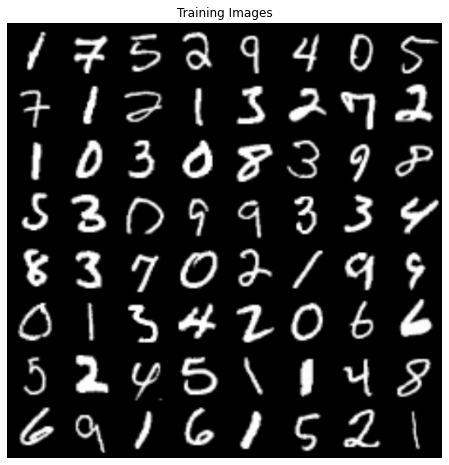

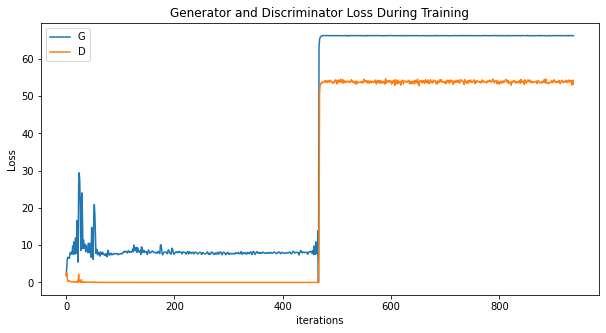

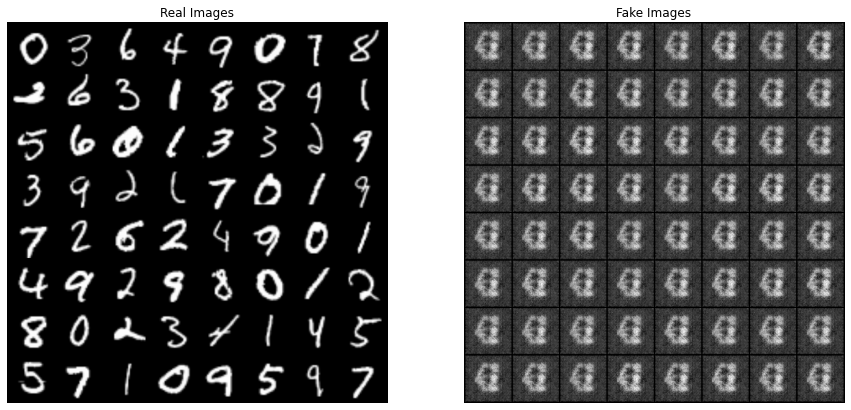

In [19]:
# Number of channels in the training images. For color images this is 3
nc = 1

dataset1 = torchvision.datasets.MNIST(root=dataroot, download=True,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize([0.5], [0.5]),
                           ]))
# Create the dataloader
dataloader1 = torch.utils.data.DataLoader(dataset1, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader1))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader1, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader1),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader1)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()



# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader1))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

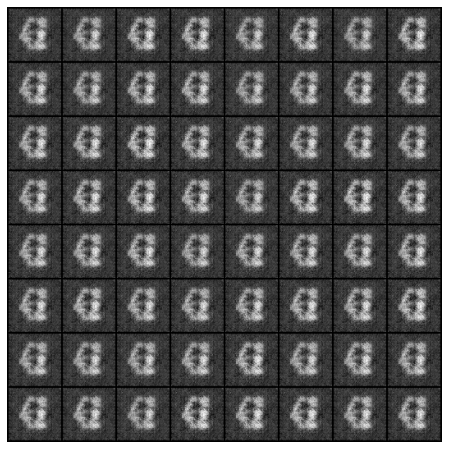

In [20]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

Image Sizes

Starting Training Loop...
[0/2][0/469]	Loss_D: 2.1523	Loss_G: 1.3943	D(x): 0.2524	D(G(z)): 0.4397 / 0.2860
[0/2][50/469]	Loss_D: 0.0401	Loss_G: 4.2649	D(x): 0.9724	D(G(z)): 0.0106 / 0.0170
[0/2][100/469]	Loss_D: 0.3968	Loss_G: 2.9264	D(x): 0.9953	D(G(z)): 0.2876 / 0.0752
[0/2][150/469]	Loss_D: 0.2454	Loss_G: 3.2939	D(x): 0.9073	D(G(z)): 0.1260 / 0.0519
[0/2][200/469]	Loss_D: 0.2907	Loss_G: 1.6134	D(x): 0.9703	D(G(z)): 0.2088 / 0.2394
[0/2][250/469]	Loss_D: 0.2318	Loss_G: 2.8672	D(x): 0.8845	D(G(z)): 0.0950 / 0.0729
[0/2][300/469]	Loss_D: 0.2821	Loss_G: 2.5748	D(x): 0.8630	D(G(z)): 0.1140 / 0.0952
[0/2][350/469]	Loss_D: 0.2091	Loss_G: 2.3479	D(x): 0.8709	D(G(z)): 0.0626 / 0.1127
[0/2][400/469]	Loss_D: 0.1027	Loss_G: 3.3180	D(x): 0.9500	D(G(z)): 0.0484 / 0.0466
[0/2][450/469]	Loss_D: 0.2788	Loss_G: 3.0092	D(x): 0.8672	D(G(z)): 0.1159 / 0.0635
[1/2][0/469]	Loss_D: 0.1652	Loss_G: 3.5447	D(x): 0.9159	D(G(z)): 0.0692 / 0.0406
[1/2][50/469]	Loss_D: 1.6100	Loss_G: 4.7920	D(x): 0.9925	D(G(z)): 

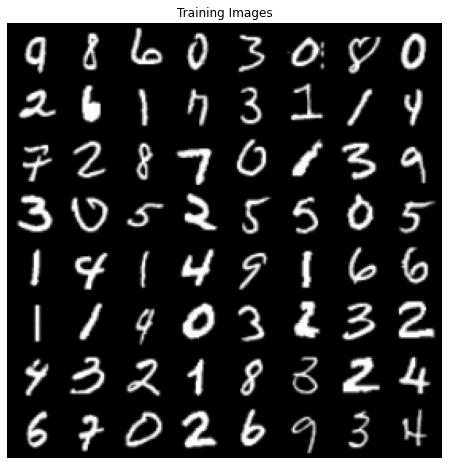

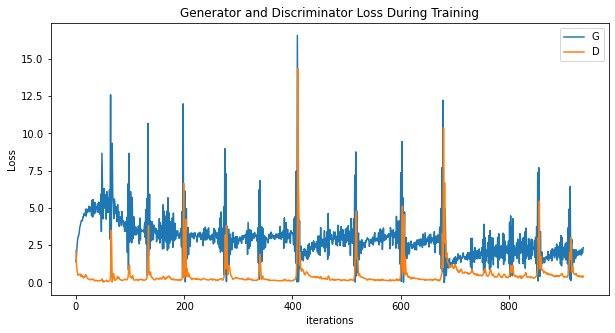

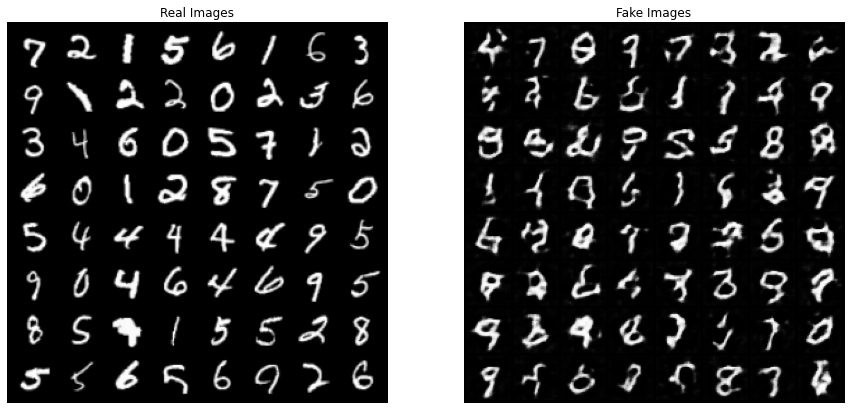

Starting Training Loop...
[0/2][0/469]	Loss_D: 2.7617	Loss_G: 0.1250	D(x): 0.2260	D(G(z)): 0.2019 / 0.9037
[0/2][50/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][100/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][150/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][200/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][250/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][300/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][350/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][400/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[0/2][450/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[1/2][0/469]	Loss_D: 100.0000	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 1.0000 / 1.0000
[1/2][50/469]	Loss_D: 100.0000	Loss_G: 0.0000	

In [ ]:
# Spatial size of training images. All images will be resized to this
#   size using a transformer.
nc = 1
for image_size in {32,128,256}:
    dataset1 = torchvision.datasets.MNIST(root=dataroot, download=True,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize([0.5], [0.5]),
                           ]))
    # Create the dataloader
    dataloader1 = torch.utils.data.DataLoader(dataset1, batch_size=batch_size,
                                            shuffle=True, num_workers=workers)

    # Decide which device we want to run on
    device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

    # Plot some training images
    real_batch = next(iter(dataloader1))
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title("Training Images")
    plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

    # Create the generator
    netG = Generator(ngpu).to(device)

    # Handle multi-gpu if desired
    if (device.type == 'cuda') and (ngpu > 1):
        netG = nn.DataParallel(netG, list(range(ngpu)))

    # Apply the weights_init function to randomly initialize all weights
    #  to mean=0, stdev=0.2.
    netG.apply(weights_init)

    # Create the Discriminator
    netD = Discriminator(ngpu).to(device)

    # Handle multi-gpu if desired
    if (device.type == 'cuda') and (ngpu > 1):
        netD = nn.DataParallel(netD, list(range(ngpu)))

    # Apply the weights_init function to randomly initialize all weights
    #  to mean=0, stdev=0.2.
    netD.apply(weights_init)

    # Initialize BCELoss function
    criterion = nn.BCELoss()

    # Create batch of latent vectors that we will use to visualize
    #  the progression of the generator
    fixed_noise = torch.randn(64, nz, 1, 1, device=device)

    # Establish convention for real and fake labels during training
    real_label = 1.
    fake_label = 0.

    # Setup Adam optimizers for both G and D
    optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
    optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

    # Training Loop

    # Lists to keep track of progress
    img_list = []
    G_losses = []
    D_losses = []
    iters = 0

    print("Starting Training Loop...")
    # For each epoch
    for epoch in range(num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader1, 0):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            ## Train with all-real batch
            netD.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            # Forward pass real batch through D
            output = netD(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = criterion(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()

            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            # Generate fake image batch with G
            fake = netG(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output, label)
            # Calculate the gradients for this batch
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-fake batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            netG.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = netD(fake).view(-1)
            # Calculate G's loss based on this output
            errG = criterion(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()

            # Output training stats
            if i % 50 == 0:
                print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                    % (epoch, num_epochs, i, len(dataloader1),
                        errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader1)-1)):
                with torch.no_grad():
                    fake = netG(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            iters += 1

    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()



    # Grab a batch of real images from the dataloader
    real_batch = next(iter(dataloader1))

    # Plot the real images
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.axis("off")
    plt.title("Real Images")
    plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

    # Plot the fake images from the last epoch
    plt.subplot(1,2,2)
    plt.axis("off")
    plt.title("Fake Images")
    plt.imshow(np.transpose(img_list[-1],(1,2,0)))
    plt.show()

# K-Means

Implementing this: https://github.com/ZeyadZanaty/image-clustering

## Preliminary Stuff

In [21]:
!wget 'http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz'
!tar xzf cifar-10-python.tar.gz

--2020-12-07 05:19:22--  http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz
Resolving www.cs.toronto.edu (www.cs.toronto.edu)... 128.100.3.30
Connecting to www.cs.toronto.edu (www.cs.toronto.edu)|128.100.3.30|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 170498071 (163M) [application/x-gzip]
Saving to: ‘cifar-10-python.tar.gz.4’

cifar-10-python.tar 100%[===================>] 162.60M  30.2MB/s    in 6.0s    

2020-12-07 05:19:28 (27.1 MB/s) - ‘cifar-10-python.tar.gz.4’ saved [170498071/170498071]



In [22]:
!git clone https://github.com/ZeyadZanaty/image-clustering.git

fatal: destination path 'image-clustering' already exists and is not an empty directory.


In [23]:
import numpy as np
import copy
from tqdm import tqdm
class KMeans:
    
    def __init__(self,n_clusters=10,max_iter=500):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.loss_per_iteration = []

    def init_centroids(self):
        np.random.seed(np.random.randint(0,100000))
        self.centroids = []
        for i in range(self.n_clusters):
            rand_index = np.random.choice(range(len(self.fit_data)))
            self.centroids.append(self.fit_data[rand_index])
    
    def init_clusters(self):
        self.clusters = {'data':{i:[] for i in range(self.n_clusters)}}
        self.clusters['labels']={i:[] for i in range(self.n_clusters)}

    def fit(self,fit_data,fit_labels):
        self.fit_data = fit_data
        self.fit_labels = fit_labels
        self.predicted_labels = [None for _ in range(self.fit_data.shape[0])]
        self.init_centroids()
        self.iterations = 0
        old_centroids = [np.zeros(shape=(fit_data.shape[1],)) for _ in range(self.n_clusters)]
        while not self.converged(self.iterations,old_centroids,self.centroids):
            old_centroids = copy.deepcopy(self.centroids)
            self.init_clusters()
            for j,sample in tqdm(enumerate(self.fit_data)):
                min_dist = float('inf')
                for i,centroid in enumerate(self.centroids):
                    dist = np.linalg.norm(sample-centroid)
                    if dist<min_dist:
                        min_dist = dist
                        self.predicted_labels[j] = i
                if self.predicted_labels[j] is not None:
                        self.clusters['data'][self.predicted_labels[j]].append(sample)                    
                        self.clusters['labels'][self.predicted_labels[j]].append(self.fit_labels[j])
            self.reshape_cluster()
            self.update_centroids()
            self.calculate_loss()
            print("\nIteration:",self.iterations,'Loss:',self.loss,'Difference:',self.centroids_dist)
            self.iterations+=1
        self.calculate_accuracy()

    def update_centroids(self):
        for i in range(self.n_clusters):
            cluster = self.clusters['data'][i]
            if cluster == []:
                self.centroids[i] = self.fit_data[np.random.choice(range(len(self.fit_data)))]
            else:
                self.centroids[i] = np.mean(np.vstack((self.centroids[i],cluster)),axis=0)
    
    def reshape_cluster(self):
        for id,mat in list(self.clusters['data'].items()):
            self.clusters['data'][id] = np.array(mat)

    def converged(self,iterations,centroids,updated_centroids):
        if iterations > self.max_iter:
            return True
        self.centroids_dist = np.linalg.norm(np.array(updated_centroids)-np.array(centroids))
        if self.centroids_dist<=1e-10:
            print("Converged! With distance:",self.centroids_dist)
            return True
        return False

    def calculate_loss(self):
        self.loss = 0
        for key,value in list(self.clusters['data'].items()):
            if value is not None:
                for v in value:
                    self.loss += np.linalg.norm(v-self.centroids[key])
        self.loss_per_iteration.append(self.loss)
    
    def calculate_accuracy(self):
        self.clusters_labels = []
        self.clusters_info = []
        self.clusters_accuracy = []
        for clust,labels in list(self.clusters['labels'].items()):
            if isinstance(labels[0],(np.ndarray)):
                labels = [l[0] for l in labels]
            occur = 0
            max_label = max(set(labels), key=labels.count)
            self.clusters_labels.append(max_label)
            for label in labels:
                if label == max_label:
                    occur+=1
            acc = occur/len(list(labels))
            self.clusters_info.append([max_label,occur,len(list(labels)),acc])
            self.clusters_accuracy.append(acc)
            self.accuracy = sum(self.clusters_accuracy)/self.n_clusters
        self.labels_ = []
        for i in range(len(self.predicted_labels)):
            self.labels_.append(self.clusters_labels[self.predicted_labels[i]])
        print('[cluster_label,no_occurence_of_label,total_samples_in_cluster,cluster_accuracy]',self.clusters_info)
        print('Accuracy:',self.accuracy)

In [24]:
import pickle
from os.path import join
from os import listdir
import matplotlib.pyplot as plt
import struct as st
class DataReader:

    def __init__(self,root_dir,type='cifar-10'):
        self.root_dir = root_dir
        self.type = type
    
    def get_dict_from_pickle(self):
            self.train_dict = unpickle(join(self.root_dir,'train'))
            self.test_dict = unpickle(join(self.root_dir,'test'))
    
    def get_train_data(self):
        if self.type == 'cifar-10':
            data = []
            labels = []
            print("Reading")
            for file_ in tqdm(listdir(self.root_dir)):
                if file_.split('_')[0] == 'data':
                    dict = unpickle(join(self.root_dir,file_))
                    data.extend(dict[b'data'])
                    labels.extend(dict[b'labels'])
            return np.array(data),np.array(labels),None
        elif self.type =='mnist':
            return self.read_mnist()

    def get_test_data(self):
        if self.type == 'cifar-10':
            data = np.empty(shape=(0,3072))
            labels = []
            for file_ in listdir(self.root_dir):
                if file_.split('_')[0] == 'test':
                    dict = unpickle(join(self.root_dir,file_))
                    data = np.vstack((data,dict[b'data']))
                    print(data[data.shape[0]-1])
                    labels.append(dict[b'labels'])
            return np.array(data),np.array(labels),None
    
    def reshape_to_plot(self,data):
        if self.type == 'mnist':
            return data.reshape(data.shape[0],28,28).astype("uint8")
        return data.reshape(data.shape[0],3,32,32).transpose(0,2,3,1).astype("uint8")

    def plot_imgs(self,in_data,n,random=False):
        data = np.array([d for d in in_data])
        data = self.reshape_to_plot(data)
        x1 = min(n//2,5)
        if x1 == 0:
            x1 = 1
        y1 = (n//x1)
        x = min(x1,y1)
        y = max(x1,y1)
        fig, ax = plt.subplots(x,y,figsize=(5,5))
        i=0
        for j in range(x):
            for k in range(y):
                if random:
                    i = np.random.choice(range(len(data)))
                ax[j][k].set_axis_off()
                ax[j][k].imshow(data[i:i+1][0])
                i+=1
        plt.show()
    
    def plot_img(self,data):
        if self.type !='mnist':
            assert data.shape == (3072,)
            data = data.reshape(1,3072)
            data = data.reshape(data.shape[0],3,32,32).transpose(0,2,3,1).astype("uint8")
        elif self.type == 'mnist':
            assert data.shape == (28*28,)
            data = data.reshape(1,28,28).astype('uint8')
        fig, ax = plt.subplots(figsize=(5,5))
        ax.imshow(data[0])
        plt.show()
    
    def read_mnist(self):  
        filename = {'images' : 'train-images-idx3-ubyte' ,'labels' : 'train-labels-idx1-ubyte'}
        labels_array = np.array([])
        data_types = {
                0x08: ('ubyte', 'B', 1),
                0x09: ('byte', 'b', 1),
                0x0B: ('>i2', 'h', 2),
                0x0C: ('>i4', 'i', 4),
                0x0D: ('>f4', 'f', 4),
                0x0E: ('>f8', 'd', 8)}
        for name in filename.keys():
            if name == 'images':
                imagesfile = open(join(self.root_dir,filename[name]),'rb')
            if name == 'labels':
                labelsfile = open(join(self.root_dir,filename[name]),'rb')
        imagesfile.seek(0)
        magic = st.unpack('>4B',imagesfile.read(4))
        if(magic[0] and magic[1])or(magic[2] not in data_types):
            raise ValueError("File Format not correct")
        nDim = magic[3]
        imagesfile.seek(4)
        nImg = st.unpack('>I',imagesfile.read(4))[0] #num of images/labels
        nR = st.unpack('>I',imagesfile.read(4))[0] #num of rows
        nC = st.unpack('>I',imagesfile.read(4))[0] #num of columns
        nBytes = nImg*nR*nC
        labelsfile.seek(8) #Since no. of items = no. of images and is already read
        images_array = 255 - np.asarray(st.unpack('>'+'B'*nBytes,imagesfile.read(nBytes))).reshape((nImg,nR,nC))
        labels_array = np.asarray(st.unpack('>'+'B'*nImg,labelsfile.read(nImg))).reshape((nImg,1))
        labels_array = [l[0] for l in labels_array]
        return images_array.reshape(60000,28*28),labels_array,None


def unpickle(file):
    import pickle
    with open(file, 'rb') as fo:
        dict = pickle.load(fo, encoding='bytes')
    return dict

## CIFAR-10

In [25]:
import matplotlib.pyplot as plt
import numpy as np
import os
os.chdir('image-clustering')

In [26]:
filep = '../cifar-10-batches-py'

100%|██████████| 8/8 [00:00<00:00, 60.68it/s]

Reading


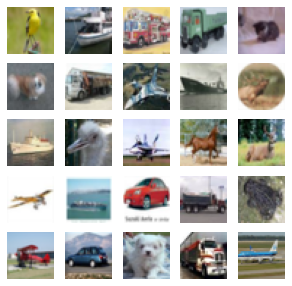

50000it [00:05, 9225.87it/s]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
573it [00:00, 5725.51it/s]


Iteration: 0 Loss: 154944026.99079415 Difference: 25985.27844761337


50000it [00:05, 8690.11it/s]
569it [00:00, 5689.91it/s]


Iteration: 1 Loss: 140810382.71091816 Difference: 12335.33350656288


50000it [00:05, 8526.06it/s]
577it [00:00, 5761.52it/s]


Iteration: 2 Loss: 139104746.18790612 Difference: 1979.3025145198187


50000it [00:05, 8374.38it/s]
577it [00:00, 5764.21it/s]


Iteration: 3 Loss: 138449681.53444827 Difference: 917.3048470755299


50000it [00:05, 8451.41it/s]
572it [00:00, 5715.20it/s]


Iteration: 4 Loss: 138097492.20313105 Difference: 586.9040785393528


50000it [00:06, 8310.48it/s]
555it [00:00, 5545.03it/s]


Iteration: 5 Loss: 137899997.64560166 Difference: 435.1543146330723


50000it [00:06, 7778.31it/s]
558it [00:00, 5570.27it/s]


Iteration: 6 Loss: 137779231.8675793 Difference: 322.47983337205125


50000it [00:06, 8018.19it/s]
572it [00:00, 5718.26it/s]


Iteration: 7 Loss: 137696089.74124065 Difference: 255.81079647715984


50000it [00:06, 8302.24it/s]
545it [00:00, 5441.12it/s]


Iteration: 8 Loss: 137628770.50876838 Difference: 213.93022347067634


50000it [00:06, 8189.61it/s]
553it [00:00, 5522.50it/s]


Iteration: 9 Loss: 137563021.75345686 Difference: 196.91474142656006


50000it [00:05, 8416.25it/s]
557it [00:00, 5562.02it/s]


Iteration: 10 Loss: 137499845.38357568 Difference: 209.6188407125546


50000it [00:05, 8412.40it/s]
529it [00:00, 5283.13it/s]


Iteration: 11 Loss: 137440716.19893548 Difference: 210.43631379731784


50000it [00:05, 8524.91it/s]
561it [00:00, 5603.66it/s]


Iteration: 12 Loss: 137397733.93653545 Difference: 213.57989787848172


50000it [00:05, 8504.30it/s]
569it [00:00, 5681.23it/s]


Iteration: 13 Loss: 137368677.56663916 Difference: 178.8794257298532


50000it [00:06, 8083.10it/s]
424it [00:00, 4237.90it/s]


Iteration: 14 Loss: 137349835.67962673 Difference: 145.47061461256504


50000it [00:06, 8173.58it/s]
558it [00:00, 5577.21it/s]


Iteration: 15 Loss: 137336652.1800532 Difference: 113.73697282701248


50000it [00:05, 8498.96it/s]
429it [00:00, 4289.33it/s]


Iteration: 16 Loss: 137326136.67397133 Difference: 92.93379894531662


50000it [00:05, 8594.30it/s]
556it [00:00, 5557.21it/s]


Iteration: 17 Loss: 137317605.92311737 Difference: 81.33966702133235


50000it [00:06, 8029.02it/s]
572it [00:00, 5715.86it/s]


Iteration: 18 Loss: 137309574.02210486 Difference: 68.483726860128


50000it [00:05, 8685.04it/s]
553it [00:00, 5529.78it/s]


Iteration: 19 Loss: 137301542.2201021 Difference: 70.28517139214438


50000it [00:05, 8597.21it/s]
555it [00:00, 5549.17it/s]


Iteration: 20 Loss: 137293383.04385296 Difference: 70.13054506883658


50000it [00:06, 8208.52it/s]
582it [00:00, 5813.08it/s]


Iteration: 21 Loss: 137284587.19311297 Difference: 70.56473740356583


50000it [00:05, 8622.03it/s]
579it [00:00, 5782.75it/s]


Iteration: 22 Loss: 137277140.3885982 Difference: 70.76027358208994


50000it [00:05, 8388.57it/s]
581it [00:00, 5800.44it/s]


Iteration: 23 Loss: 137270643.87412006 Difference: 60.69309848086679


50000it [00:05, 8934.13it/s]
589it [00:00, 5879.16it/s]


Iteration: 24 Loss: 137263874.82485074 Difference: 61.814163777596086


50000it [00:05, 8576.32it/s]
558it [00:00, 5573.47it/s]


Iteration: 25 Loss: 137256512.4470574 Difference: 66.77224701025101


50000it [00:05, 8483.00it/s]
574it [00:00, 5732.93it/s]


Iteration: 26 Loss: 137248377.14280045 Difference: 69.90340527687773


50000it [00:05, 8614.38it/s]
439it [00:00, 4380.04it/s]


Iteration: 27 Loss: 137239136.0864245 Difference: 77.50323744621961


50000it [00:06, 8303.61it/s]
442it [00:00, 4410.97it/s]


Iteration: 28 Loss: 137229997.95421907 Difference: 81.83912281418306


50000it [00:05, 8726.32it/s]
585it [00:00, 5849.53it/s]


Iteration: 29 Loss: 137219866.69165385 Difference: 81.9950220971947


50000it [00:06, 8330.51it/s]
575it [00:00, 5739.85it/s]


Iteration: 30 Loss: 137207817.22279546 Difference: 88.3603110990298


50000it [00:05, 8569.70it/s]
535it [00:00, 5342.95it/s]


Iteration: 31 Loss: 137191422.8058038 Difference: 100.33880326458778


50000it [00:06, 8095.71it/s]
564it [00:00, 5632.14it/s]


Iteration: 32 Loss: 137168764.76560345 Difference: 116.57299574090554


50000it [00:05, 8489.10it/s]
531it [00:00, 5306.45it/s]


Iteration: 33 Loss: 137136760.64331466 Difference: 141.80701170284533


50000it [00:06, 8325.54it/s]
537it [00:00, 5367.46it/s]


Iteration: 34 Loss: 137096842.44867992 Difference: 157.0563683275727


50000it [00:06, 7991.86it/s]
516it [00:00, 5155.30it/s]


Iteration: 35 Loss: 137051778.8827429 Difference: 183.91026831711005


50000it [00:06, 8241.48it/s]
565it [00:00, 5641.22it/s]


Iteration: 36 Loss: 137003605.62108183 Difference: 184.65306508630331


50000it [00:06, 8215.75it/s]
560it [00:00, 5596.83it/s]


Iteration: 37 Loss: 136961337.72328743 Difference: 183.14402570098164


50000it [00:06, 8079.77it/s]
574it [00:00, 5730.82it/s]


Iteration: 38 Loss: 136925507.4348279 Difference: 170.97015806341884


50000it [00:05, 8380.76it/s]
581it [00:00, 5803.79it/s]


Iteration: 39 Loss: 136899396.12819594 Difference: 148.75158855657665


50000it [00:05, 8468.94it/s]
596it [00:00, 5951.41it/s]


Iteration: 40 Loss: 136877679.44369575 Difference: 129.4688668259303


50000it [00:06, 8266.87it/s]
420it [00:00, 4199.00it/s]


Iteration: 41 Loss: 136860146.25786555 Difference: 113.14265144611096


50000it [00:05, 8551.48it/s]
588it [00:00, 5879.74it/s]


Iteration: 42 Loss: 136846362.25275177 Difference: 100.02126218391048


50000it [00:05, 8418.32it/s]
580it [00:00, 5792.93it/s]


Iteration: 43 Loss: 136835565.09824666 Difference: 86.08584976111017


50000it [00:05, 8579.22it/s]
587it [00:00, 5868.62it/s]


Iteration: 44 Loss: 136828300.61226103 Difference: 76.86505998789


50000it [00:06, 8149.06it/s]
584it [00:00, 5839.81it/s]


Iteration: 45 Loss: 136821733.52434117 Difference: 64.13122941156212


50000it [00:06, 8121.45it/s]
570it [00:00, 5697.89it/s]


Iteration: 46 Loss: 136816245.71898368 Difference: 60.95769080510328


50000it [00:05, 8646.88it/s]
610it [00:00, 6094.14it/s]


Iteration: 47 Loss: 136811661.93330708 Difference: 53.155614756973776


50000it [00:05, 8644.73it/s]
596it [00:00, 5951.75it/s]


Iteration: 48 Loss: 136808073.08329654 Difference: 47.023715904911896


50000it [00:06, 8254.72it/s]
581it [00:00, 5799.26it/s]


Iteration: 49 Loss: 136804909.9868095 Difference: 40.28877171456107


50000it [00:05, 8772.99it/s]
568it [00:00, 5679.07it/s]


Iteration: 50 Loss: 136801862.3414136 Difference: 39.53292553945201


50000it [00:06, 8242.42it/s]
544it [00:00, 5433.36it/s]


Iteration: 51 Loss: 136799336.29512247 Difference: 33.81270038645072


50000it [00:06, 8316.52it/s]
590it [00:00, 5895.79it/s]


Iteration: 52 Loss: 136796997.23527023 Difference: 31.562196998303115


50000it [00:05, 8439.79it/s]
575it [00:00, 5748.46it/s]


Iteration: 53 Loss: 136795189.5747056 Difference: 30.278647741925912


50000it [00:05, 8581.71it/s]
557it [00:00, 5565.85it/s]


Iteration: 54 Loss: 136793600.8836411 Difference: 28.207988942264578


50000it [00:06, 8075.08it/s]
423it [00:00, 4229.57it/s]


Iteration: 55 Loss: 136792096.50107723 Difference: 26.49090658190697


50000it [00:06, 8198.24it/s]
563it [00:00, 5622.83it/s]


Iteration: 56 Loss: 136790170.2471308 Difference: 29.283025193758895


50000it [00:05, 8430.39it/s]
581it [00:00, 5799.70it/s]


Iteration: 57 Loss: 136788566.93737164 Difference: 28.233117723061085


50000it [00:05, 8566.51it/s]
574it [00:00, 5730.21it/s]


Iteration: 58 Loss: 136787391.80209413 Difference: 24.80528979487647


50000it [00:05, 8482.15it/s]
587it [00:00, 5862.58it/s]


Iteration: 59 Loss: 136785847.67871556 Difference: 24.714403404887634


50000it [00:06, 8278.79it/s]
577it [00:00, 5760.45it/s]


Iteration: 60 Loss: 136785003.2853627 Difference: 21.43756026550635


50000it [00:05, 8398.74it/s]
578it [00:00, 5771.21it/s]


Iteration: 61 Loss: 136783383.54282635 Difference: 23.17064208552002


50000it [00:05, 8407.97it/s]
594it [00:00, 5934.76it/s]


Iteration: 62 Loss: 136782202.57926276 Difference: 22.395402147620466


50000it [00:05, 8402.43it/s]
535it [00:00, 5339.26it/s]


Iteration: 63 Loss: 136780722.02336356 Difference: 24.02657386625026


50000it [00:05, 8508.37it/s]
572it [00:00, 5717.17it/s]


Iteration: 64 Loss: 136779826.92361856 Difference: 24.092823985248042


50000it [00:06, 8102.44it/s]
580it [00:00, 5793.11it/s]


Iteration: 65 Loss: 136778738.58167663 Difference: 19.207725711883946


50000it [00:06, 8129.60it/s]
556it [00:00, 5554.02it/s]


Iteration: 66 Loss: 136777610.04555768 Difference: 21.55807650352432


50000it [00:05, 8474.55it/s]
571it [00:00, 5703.67it/s]


Iteration: 67 Loss: 136776310.52596343 Difference: 22.79419735492571


50000it [00:05, 8676.26it/s]
581it [00:00, 5799.29it/s]


Iteration: 68 Loss: 136775027.8009199 Difference: 21.537038932876705


50000it [00:05, 8590.24it/s]
480it [00:00, 4792.76it/s]


Iteration: 69 Loss: 136774056.252201 Difference: 20.22165972069234


50000it [00:05, 8769.62it/s]
592it [00:00, 5911.16it/s]


Iteration: 70 Loss: 136772929.6260271 Difference: 18.61975686661436


50000it [00:05, 8838.33it/s]
596it [00:00, 5956.09it/s]


Iteration: 71 Loss: 136772247.3890014 Difference: 18.639393662484235


50000it [00:05, 8784.22it/s]
596it [00:00, 5959.98it/s]


Iteration: 72 Loss: 136771843.86813304 Difference: 15.082994837829979


50000it [00:05, 8531.00it/s]
572it [00:00, 5718.33it/s]


Iteration: 73 Loss: 136771290.7304955 Difference: 13.535086523935451


50000it [00:05, 8546.90it/s]
442it [00:00, 4419.81it/s]


Iteration: 74 Loss: 136770630.12008336 Difference: 14.602653701523396


50000it [00:05, 8574.64it/s]
569it [00:00, 5687.85it/s]


Iteration: 75 Loss: 136770153.43500313 Difference: 12.80402462112576


50000it [00:05, 8893.76it/s]
591it [00:00, 5901.02it/s]


Iteration: 76 Loss: 136769720.8862837 Difference: 13.385013537554729


50000it [00:06, 8201.09it/s]
606it [00:00, 6054.12it/s]


Iteration: 77 Loss: 136769270.618987 Difference: 12.92324442412719


50000it [00:05, 8589.63it/s]
589it [00:00, 5884.35it/s]


Iteration: 78 Loss: 136768892.86861622 Difference: 14.371632892158116


50000it [00:05, 8571.62it/s]
588it [00:00, 5875.52it/s]


Iteration: 79 Loss: 136768533.82324055 Difference: 13.798758582599048


50000it [00:05, 8447.91it/s]
590it [00:00, 5896.14it/s]


Iteration: 80 Loss: 136768006.14227396 Difference: 10.727459675698343


50000it [00:06, 8208.12it/s]
568it [00:00, 5674.67it/s]


Iteration: 81 Loss: 136767427.90936732 Difference: 11.66095289878727


50000it [00:06, 8222.44it/s]
591it [00:00, 5902.14it/s]


Iteration: 82 Loss: 136766981.77537432 Difference: 12.379515622147622


50000it [00:06, 8266.76it/s]
597it [00:00, 5966.08it/s]


Iteration: 83 Loss: 136766742.83592412 Difference: 13.38411360989525


50000it [00:05, 8706.30it/s]
569it [00:00, 5681.93it/s]


Iteration: 84 Loss: 136766489.0635898 Difference: 12.14006644294169


50000it [00:05, 8613.46it/s]
581it [00:00, 5809.65it/s]


Iteration: 85 Loss: 136766461.39044723 Difference: 12.602343944904824


50000it [00:06, 8268.01it/s]
433it [00:00, 4325.72it/s]


Iteration: 86 Loss: 136766434.8401009 Difference: 11.73585213228902


50000it [00:06, 8230.24it/s]
598it [00:00, 5969.42it/s]


Iteration: 87 Loss: 136766232.41977984 Difference: 11.754264046234548


50000it [00:05, 8430.46it/s]
535it [00:00, 5344.63it/s]


Iteration: 88 Loss: 136766127.88429022 Difference: 11.57513026320078


50000it [00:05, 8642.98it/s]
575it [00:00, 5743.75it/s]


Iteration: 89 Loss: 136765991.99299237 Difference: 11.090212747250126


50000it [00:05, 8344.66it/s]
567it [00:00, 5668.15it/s]


Iteration: 90 Loss: 136765852.40238333 Difference: 8.663379102665653


50000it [00:05, 8443.32it/s]
575it [00:00, 5744.75it/s]


Iteration: 91 Loss: 136765687.58925417 Difference: 8.314785795675235


50000it [00:05, 8690.78it/s]
565it [00:00, 5645.51it/s]


Iteration: 92 Loss: 136765618.6168875 Difference: 8.460517617448279


50000it [00:05, 8559.20it/s]
442it [00:00, 4416.73it/s]


Iteration: 93 Loss: 136765508.93248922 Difference: 8.310480025019721


50000it [00:06, 8274.87it/s]
590it [00:00, 5890.02it/s]


Iteration: 94 Loss: 136765415.9512246 Difference: 6.719809486575231


50000it [00:06, 8256.00it/s]
479it [00:00, 4786.63it/s]


Iteration: 95 Loss: 136765550.6330507 Difference: 7.569831660596073


50000it [00:05, 8490.87it/s]
603it [00:00, 6023.66it/s]


Iteration: 96 Loss: 136765656.70158395 Difference: 5.707255383910223


50000it [00:05, 8861.39it/s]
575it [00:00, 5746.48it/s]


Iteration: 97 Loss: 136765662.93801263 Difference: 5.311141008472278


50000it [00:06, 8292.34it/s]
610it [00:00, 6091.45it/s]


Iteration: 98 Loss: 136765749.20086142 Difference: 5.341726732068234


50000it [00:05, 8484.09it/s]
595it [00:00, 5940.62it/s]


Iteration: 99 Loss: 136765752.04557765 Difference: 5.235487493648016


50000it [00:05, 8743.45it/s]
608it [00:00, 6078.50it/s]


Iteration: 100 Loss: 136765772.30294725 Difference: 4.955365028050504


50000it [00:05, 8601.68it/s]
579it [00:00, 5782.73it/s]


Iteration: 101 Loss: 136765653.10058972 Difference: 5.891368115308857


50000it [00:05, 8397.11it/s]
593it [00:00, 5924.72it/s]


Iteration: 102 Loss: 136765632.9618557 Difference: 5.39171388813129


50000it [00:05, 8771.56it/s]
603it [00:00, 6027.43it/s]


Iteration: 103 Loss: 136765731.62959132 Difference: 5.2745091207882995


50000it [00:05, 8539.97it/s]
594it [00:00, 5937.36it/s]


Iteration: 104 Loss: 136765751.09702605 Difference: 6.605801258288733


50000it [00:05, 8606.58it/s]
587it [00:00, 5863.10it/s]


Iteration: 105 Loss: 136765848.36784518 Difference: 6.812635129256609


50000it [00:05, 8450.27it/s]
594it [00:00, 5931.97it/s]


Iteration: 106 Loss: 136765705.11993223 Difference: 6.2860835943351505


50000it [00:05, 8613.83it/s]
586it [00:00, 5859.77it/s]


Iteration: 107 Loss: 136765668.43799606 Difference: 6.545693820664836


50000it [00:05, 8699.51it/s]
586it [00:00, 5850.99it/s]


Iteration: 108 Loss: 136765655.34037936 Difference: 6.369453710701344


50000it [00:05, 8775.57it/s]
591it [00:00, 5901.93it/s]


Iteration: 109 Loss: 136765471.53360456 Difference: 8.086320478397855


50000it [00:06, 8107.00it/s]
562it [00:00, 5619.01it/s]


Iteration: 110 Loss: 136765583.8168263 Difference: 8.691952661153817


50000it [00:05, 8945.24it/s]
421it [00:00, 4202.95it/s]


Iteration: 111 Loss: 136765490.09054592 Difference: 7.269144913136725


50000it [00:05, 8864.42it/s]
580it [00:00, 5796.59it/s]


Iteration: 112 Loss: 136765445.4027933 Difference: 5.898217621857408


50000it [00:05, 8736.32it/s]
583it [00:00, 5824.26it/s]


Iteration: 113 Loss: 136765431.3354054 Difference: 5.522926577496487


50000it [00:05, 8376.20it/s]
445it [00:00, 4444.68it/s]


Iteration: 114 Loss: 136765397.45417586 Difference: 5.81883344575728


50000it [00:06, 8261.27it/s]
588it [00:00, 5875.40it/s]


Iteration: 115 Loss: 136765350.7569359 Difference: 6.077760262794882


50000it [00:06, 8146.62it/s]
459it [00:00, 4587.55it/s]


Iteration: 116 Loss: 136765274.93012676 Difference: 6.097256544189329


50000it [00:05, 8758.72it/s]
438it [00:00, 4379.28it/s]


Iteration: 117 Loss: 136765053.5211036 Difference: 6.595161806326434


50000it [00:06, 7974.73it/s]
568it [00:00, 5671.03it/s]


Iteration: 118 Loss: 136764854.03545463 Difference: 5.915885569818368


50000it [00:05, 8727.64it/s]
593it [00:00, 5920.90it/s]


Iteration: 119 Loss: 136764766.02968606 Difference: 4.542738125997261


50000it [00:05, 9036.78it/s]
584it [00:00, 5837.04it/s]


Iteration: 120 Loss: 136764727.15099287 Difference: 4.190898236518607


50000it [00:05, 8508.00it/s]
583it [00:00, 5820.97it/s]


Iteration: 121 Loss: 136764701.5588071 Difference: 2.8639640073333212


50000it [00:05, 8948.51it/s]
580it [00:00, 5791.13it/s]


Iteration: 122 Loss: 136764706.901983 Difference: 2.5323681382703143


50000it [00:05, 8776.33it/s]
576it [00:00, 5759.47it/s]


Iteration: 123 Loss: 136764698.92598784 Difference: 1.0984872511741148


50000it [00:05, 8464.13it/s]
567it [00:00, 5665.32it/s]


Iteration: 124 Loss: 136764679.9464948 Difference: 0.8863243043835943


50000it [00:05, 8675.22it/s]
433it [00:00, 4321.83it/s]


Iteration: 125 Loss: 136764683.4342871 Difference: 0.7290607674528145


50000it [00:05, 8647.22it/s]
594it [00:00, 5930.28it/s]


Iteration: 126 Loss: 136764675.84194896 Difference: 1.0201078769972183


50000it [00:05, 8382.35it/s]
562it [00:00, 5612.40it/s]


Iteration: 127 Loss: 136764688.03445777 Difference: 1.281880186664894


50000it [00:05, 8644.18it/s]
579it [00:00, 5784.05it/s]


Iteration: 128 Loss: 136764678.9070109 Difference: 0.833262777346691


50000it [00:05, 8860.68it/s]
591it [00:00, 5895.22it/s]


Iteration: 129 Loss: 136764671.71996668 Difference: 1.1646922826563457


50000it [00:05, 8598.87it/s]
568it [00:00, 5679.41it/s]


Iteration: 130 Loss: 136764657.9934971 Difference: 0.5399519353454348


50000it [00:05, 8775.39it/s]
601it [00:00, 6003.32it/s]


Iteration: 131 Loss: 136764613.4445852 Difference: 0.5584624733863898


50000it [00:05, 8676.50it/s]
578it [00:00, 5771.94it/s]


Iteration: 132 Loss: 136764613.89034212 Difference: 0.922212635140451


50000it [00:05, 8394.51it/s]
592it [00:00, 5916.03it/s]


Iteration: 133 Loss: 136764641.68425652 Difference: 1.257165192473976


50000it [00:05, 8742.53it/s]
581it [00:00, 5803.32it/s]


Iteration: 134 Loss: 136764626.2162315 Difference: 1.736285784412399


50000it [00:05, 8847.42it/s]
438it [00:00, 4379.00it/s]


Iteration: 135 Loss: 136764638.63233566 Difference: 1.0136694742979608


50000it [00:05, 8541.64it/s]
583it [00:00, 5822.84it/s]


Iteration: 136 Loss: 136764654.96295086 Difference: 0.9850598909086612


50000it [00:05, 8543.99it/s]
606it [00:00, 6052.80it/s]


Iteration: 137 Loss: 136764644.60976335 Difference: 1.723071949435105


50000it [00:05, 8625.82it/s]
589it [00:00, 5882.81it/s]


Iteration: 138 Loss: 136764627.07730496 Difference: 1.0887047160221686


50000it [00:06, 8225.59it/s]
604it [00:00, 6039.63it/s]


Iteration: 139 Loss: 136764582.9521271 Difference: 1.3507383306929772


50000it [00:05, 8920.77it/s]
441it [00:00, 4406.35it/s]


Iteration: 140 Loss: 136764553.16815755 Difference: 1.1317008300006088


50000it [00:05, 8511.06it/s]
558it [00:00, 5570.81it/s]


Iteration: 141 Loss: 136764553.1616399 Difference: 0.9736635866935698


50000it [00:05, 8807.15it/s]
598it [00:00, 5978.48it/s]


Iteration: 142 Loss: 136764553.16163856 Difference: 0.00023179498599672986


50000it [00:05, 9058.14it/s]



Iteration: 143 Loss: 136764553.16163856 Difference: 5.5865941754739056e-08
Converged! With distance: 1.3654694072234728e-11
[cluster_label,no_occurence_of_label,total_samples_in_cluster,cluster_accuracy] [[7, 828, 4656, 0.17783505154639176], [8, 1243, 4441, 0.2798919162350822], [4, 891, 4481, 0.19883954474447668], [8, 1289, 3944, 0.32682555780933065], [6, 1182, 5367, 0.22023476802683062], [5, 925, 5301, 0.17449537823052255], [9, 1558, 5077, 0.30687413827063226], [5, 940, 5120, 0.18359375], [6, 1346, 8117, 0.16582481212270545], [0, 1206, 3496, 0.34496567505720827]]
Accuracy: 0.23793805920431801


In [27]:
data_reader = DataReader(filep,'cifar-10')

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

tr_data, tr_class_labels, tr_subclass_labels = data_reader.get_train_data()
data_reader.plot_imgs(tr_data,25,True)

kmeans = KMeans(n_clusters=10,max_iter=200)
kmeans.fit(tr_data,tr_class_labels)

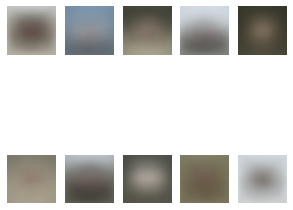

In [28]:
data_reader.plot_imgs(kmeans.centroids,len(kmeans.centroids))

Loss


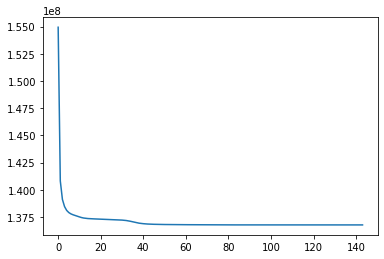

In [29]:
print('Loss')
plt.plot(range(kmeans.iterations),kmeans.loss_per_iteration)
plt.show()

Cluster: 0 Label: horse


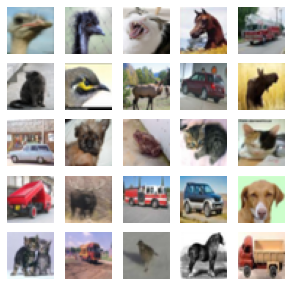

Cluster: 1 Label: ship


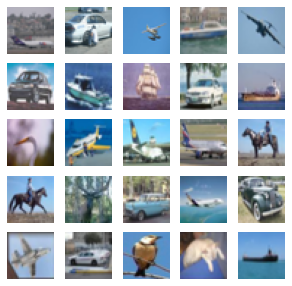

Cluster: 2 Label: deer


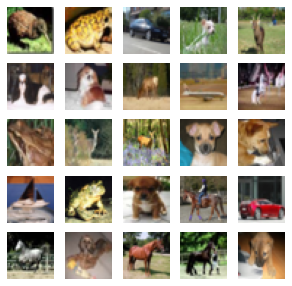

Cluster: 3 Label: ship


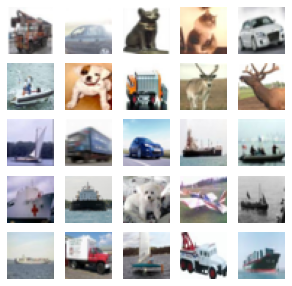

Cluster: 4 Label: frog


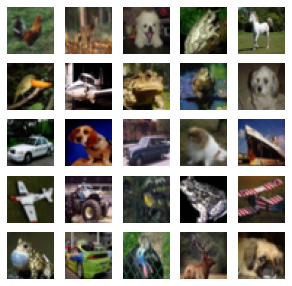

Cluster: 5 Label: dog


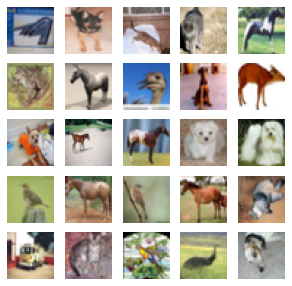

Cluster: 6 Label: truck


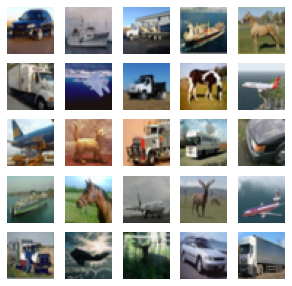

Cluster: 7 Label: dog


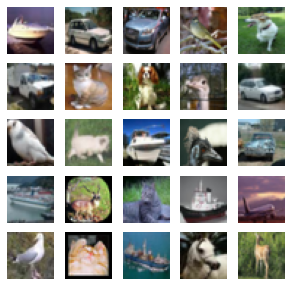

Cluster: 8 Label: frog


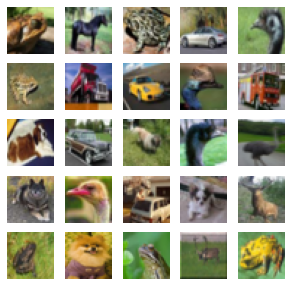

Cluster: 9 Label: airplane


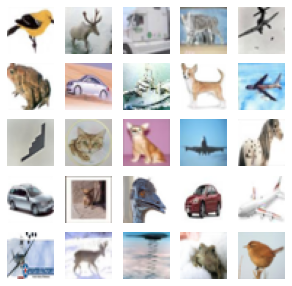

[cluster_label,no_occurence_of_label,total_samples_in_cluster,cluster_accuracy]
 [[7, 828, 4656, 0.17783505154639176], [8, 1243, 4441, 0.2798919162350822], [4, 891, 4481, 0.19883954474447668], [8, 1289, 3944, 0.32682555780933065], [6, 1182, 5367, 0.22023476802683062], [5, 925, 5301, 0.17449537823052255], [9, 1558, 5077, 0.30687413827063226], [5, 940, 5120, 0.18359375], [6, 1346, 8117, 0.16582481212270545], [0, 1206, 3496, 0.34496567505720827]]
Accuracy: 0.23793805920431801


In [30]:
classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


for key,data in list(kmeans.clusters['data'].items()):
    print('Cluster:',key,'Label:',classes[kmeans.clusters_labels[key]])
    data_reader.plot_imgs(data[:min(25,data.shape[0])],min(25,data.shape[0]))

print('[cluster_label,no_occurence_of_label,total_samples_in_cluster,cluster_accuracy]\n',kmeans.clusters_info)
print('Accuracy:',kmeans.accuracy)

## MNIST

In [1]:
!wget 'http://yann.lecun.com/exdb/mnist/train-images-idx3-ubyte.gz'
!wget 'http://yann.lecun.com/exdb/mnist/train-labels-idx1-ubyte.gz'
!gunzip train-images-idx3-ubyte.gz
!gunzip train-labels-idx1-ubyte.gz

--2020-12-07 06:27:25--  http://yann.lecun.com/exdb/mnist/train-images-idx3-ubyte.gz
Resolving yann.lecun.com (yann.lecun.com)... 104.28.7.204, 104.28.6.204, 172.67.171.76, ...
Connecting to yann.lecun.com (yann.lecun.com)|104.28.7.204|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9912422 (9.5M) [application/x-gzip]
Saving to: ‘train-images-idx3-ubyte.gz’

train-images-idx3-u 100%[===================>]   9.45M  2.71MB/s    in 3.8s    

2020-12-07 06:27:29 (2.48 MB/s) - ‘train-images-idx3-ubyte.gz’ saved [9912422/9912422]

--2020-12-07 06:27:29--  http://yann.lecun.com/exdb/mnist/train-labels-idx1-ubyte.gz
Resolving yann.lecun.com (yann.lecun.com)... 104.28.7.204, 104.28.6.204, 172.67.171.76, ...
Connecting to yann.lecun.com (yann.lecun.com)|104.28.7.204|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28881 (28K) [application/x-gzip]
Saving to: ‘train-labels-idx1-ubyte.gz’

train-labels-idx1-u 100%[===================>]  28.20K  --.-KB

In [2]:
!git clone https://github.com/ZeyadZanaty/image-clustering.git

fatal: destination path 'image-clustering' already exists and is not an empty directory.


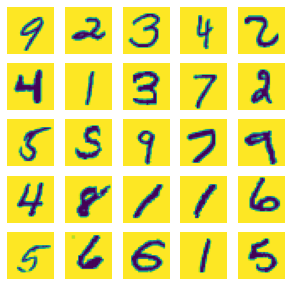

In [3]:
import os
os.chdir('image-clustering')
from DataReader import DataReader
from KMeans import KMeans
import matplotlib.pyplot as plt
import numpy as np

data_reader = DataReader('../','mnist')
tr_data, tr_class_labels, tr_subclass_labels = data_reader.get_train_data()
data_reader.plot_imgs(tr_data,25,True)

In [4]:
kmeans = KMeans(n_clusters=10,max_iter=200)
kmeans.fit(tr_data,tr_class_labels)

60000it [00:06, 9789.86it/s] 
1080it [00:00, 10798.93it/s]


Iteration: 0 Loss: 100428458.3183361 Difference: 20787.310408034995


60000it [00:05, 10082.88it/s]
1058it [00:00, 10572.25it/s]


Iteration: 1 Loss: 97142440.48779504 Difference: 4457.263486000375


60000it [00:05, 10047.68it/s]
1016it [00:00, 10158.63it/s]


Iteration: 2 Loss: 95810111.33581619 Difference: 883.2415001088946


60000it [00:05, 10161.58it/s]
1054it [00:00, 10530.59it/s]


Iteration: 3 Loss: 95145496.46441463 Difference: 550.6710423536575


60000it [00:05, 10228.70it/s]
861it [00:00, 8604.16it/s]


Iteration: 4 Loss: 94808080.76007311 Difference: 372.21144682108394


60000it [00:06, 9927.30it/s] 
831it [00:00, 8307.81it/s]


Iteration: 5 Loss: 94643263.80625835 Difference: 254.35453785532206


60000it [00:06, 9519.89it/s]
1040it [00:00, 10399.34it/s]


Iteration: 6 Loss: 94563211.81182155 Difference: 171.35030147976036


60000it [00:05, 10100.06it/s]
1052it [00:00, 10513.19it/s]


Iteration: 7 Loss: 94523615.62772553 Difference: 119.45356806465342


60000it [00:05, 10302.53it/s]
1047it [00:00, 10462.23it/s]


Iteration: 8 Loss: 94502823.2081753 Difference: 79.17002286410704


60000it [00:06, 9694.11it/s] 
1094it [00:00, 10933.15it/s]


Iteration: 9 Loss: 94489822.24296534 Difference: 55.07323463177558


60000it [00:06, 9853.91it/s]
1037it [00:00, 10360.55it/s]


Iteration: 10 Loss: 94482409.6881073 Difference: 42.65621646159467


60000it [00:05, 10154.03it/s]
1047it [00:00, 10469.01it/s]


Iteration: 11 Loss: 94477699.83960503 Difference: 29.57713527399448


60000it [00:05, 10081.78it/s]
1049it [00:00, 10488.21it/s]


Iteration: 12 Loss: 94474479.13252722 Difference: 21.653167507901795


60000it [00:05, 10273.33it/s]
910it [00:00, 9097.60it/s]


Iteration: 13 Loss: 94471221.52742302 Difference: 19.422179710165103


60000it [00:06, 9807.83it/s] 
1079it [00:00, 10784.41it/s]


Iteration: 14 Loss: 94468512.61483735 Difference: 17.613517377888513


60000it [00:05, 10220.62it/s]
855it [00:00, 8545.51it/s]


Iteration: 15 Loss: 94466477.6857797 Difference: 14.098578828757613


60000it [00:05, 10110.98it/s]
1032it [00:00, 10311.95it/s]


Iteration: 16 Loss: 94465282.32832475 Difference: 12.271794963777197


60000it [00:06, 9894.53it/s]
838it [00:00, 8374.18it/s]


Iteration: 17 Loss: 94464113.19538367 Difference: 10.542973346079489


60000it [00:06, 9769.56it/s] 
1104it [00:00, 11033.88it/s]


Iteration: 18 Loss: 94463470.54734021 Difference: 9.630411390309712


60000it [00:05, 10515.55it/s]
1059it [00:00, 10589.38it/s]


Iteration: 19 Loss: 94462956.7392678 Difference: 6.476127817779057


60000it [00:05, 10191.33it/s]
1059it [00:00, 10587.61it/s]


Iteration: 20 Loss: 94462624.38347757 Difference: 6.33673542533098


60000it [00:05, 10238.97it/s]
1073it [00:00, 10727.27it/s]


Iteration: 21 Loss: 94462321.54978545 Difference: 7.50716582420662


60000it [00:05, 10133.52it/s]
1053it [00:00, 10529.56it/s]


Iteration: 22 Loss: 94462151.45388895 Difference: 6.66118902049125


60000it [00:05, 10446.69it/s]
1057it [00:00, 10566.61it/s]


Iteration: 23 Loss: 94462320.3089965 Difference: 7.1701405855088485


60000it [00:06, 9782.09it/s]
1064it [00:00, 10634.81it/s]


Iteration: 24 Loss: 94462145.37483446 Difference: 6.867948403012987


60000it [00:05, 10254.47it/s]
1079it [00:00, 10782.09it/s]


Iteration: 25 Loss: 94461921.98365322 Difference: 6.340475266537971


60000it [00:06, 9913.48it/s] 
1094it [00:00, 10939.59it/s]


Iteration: 26 Loss: 94461788.90215847 Difference: 7.226706920594986


60000it [00:05, 10086.49it/s]
1052it [00:00, 10515.62it/s]


Iteration: 27 Loss: 94461827.56932993 Difference: 9.107472430990052


60000it [00:05, 10628.19it/s]
836it [00:00, 8351.03it/s]


Iteration: 28 Loss: 94462476.75960095 Difference: 9.715603579543828


60000it [00:05, 10172.49it/s]
1090it [00:00, 10897.49it/s]


Iteration: 29 Loss: 94463135.43322048 Difference: 9.718580637272396


60000it [00:05, 10350.08it/s]
958it [00:00, 9576.52it/s]


Iteration: 30 Loss: 94463895.88327809 Difference: 11.287317846413064


60000it [00:05, 10214.97it/s]
825it [00:00, 8243.80it/s]


Iteration: 31 Loss: 94463994.56451759 Difference: 12.483081950981035


60000it [00:06, 9717.63it/s]
1051it [00:00, 10504.38it/s]


Iteration: 32 Loss: 94464570.71021365 Difference: 14.578351860680314


60000it [00:06, 9919.51it/s]
1082it [00:00, 10818.49it/s]


Iteration: 33 Loss: 94465205.5878463 Difference: 19.741992366660558


60000it [00:06, 9555.44it/s] 
1073it [00:00, 10725.23it/s]


Iteration: 34 Loss: 94465627.45533894 Difference: 21.460977050954856


60000it [00:05, 10712.62it/s]
1065it [00:00, 10647.40it/s]


Iteration: 35 Loss: 94465720.43709812 Difference: 25.557726476376672


60000it [00:05, 10120.47it/s]
1093it [00:00, 10920.82it/s]


Iteration: 36 Loss: 94465198.35731257 Difference: 28.249153530573942


60000it [00:05, 10264.47it/s]
1067it [00:00, 10663.81it/s]


Iteration: 37 Loss: 94463362.9809381 Difference: 33.70219341680221


60000it [00:05, 10117.57it/s]
1075it [00:00, 10747.68it/s]


Iteration: 38 Loss: 94459930.13004988 Difference: 39.71810444578884


60000it [00:05, 10008.45it/s]
875it [00:00, 8744.32it/s]


Iteration: 39 Loss: 94453777.97804476 Difference: 46.461415252024295


60000it [00:05, 10037.38it/s]
1111it [00:00, 11102.94it/s]


Iteration: 40 Loss: 94447629.009604 Difference: 51.94989556213747


60000it [00:05, 10325.37it/s]
1069it [00:00, 10682.04it/s]


Iteration: 41 Loss: 94441953.22986957 Difference: 53.849950542946154


60000it [00:05, 10239.16it/s]
1073it [00:00, 10726.17it/s]


Iteration: 42 Loss: 94436008.72085294 Difference: 56.92871721059829


60000it [00:05, 10443.03it/s]
1127it [00:00, 11263.27it/s]


Iteration: 43 Loss: 94429936.44419086 Difference: 56.75207372909996


60000it [00:05, 10721.76it/s]
1114it [00:00, 11131.52it/s]


Iteration: 44 Loss: 94425141.12252964 Difference: 56.19060105174282


60000it [00:05, 10257.29it/s]
1045it [00:00, 10441.92it/s]


Iteration: 45 Loss: 94422433.19530253 Difference: 47.06222680978435


60000it [00:05, 10208.22it/s]
1055it [00:00, 10548.63it/s]


Iteration: 46 Loss: 94421309.75186758 Difference: 40.76335205295689


60000it [00:05, 10250.06it/s]
1100it [00:00, 10999.38it/s]


Iteration: 47 Loss: 94420379.47005251 Difference: 32.863198631366245


60000it [00:05, 10179.72it/s]
864it [00:00, 8637.13it/s]


Iteration: 48 Loss: 94419946.93124402 Difference: 28.267867376500845


60000it [00:06, 9898.91it/s] 
1087it [00:00, 10869.00it/s]


Iteration: 49 Loss: 94419887.68431205 Difference: 22.451154829788535


60000it [00:05, 10306.13it/s]
1121it [00:00, 11207.12it/s]


Iteration: 50 Loss: 94419597.72059198 Difference: 19.868878091674535


60000it [00:05, 10496.90it/s]
1106it [00:00, 11054.98it/s]


Iteration: 51 Loss: 94419260.99233492 Difference: 15.89569709772562


60000it [00:05, 10281.68it/s]
925it [00:00, 9246.42it/s]


Iteration: 52 Loss: 94418399.94081295 Difference: 15.174833982802344


60000it [00:06, 9937.95it/s] 
1129it [00:00, 11286.16it/s]


Iteration: 53 Loss: 94417420.76060793 Difference: 11.853519552874575


60000it [00:05, 10082.54it/s]
1100it [00:00, 10997.73it/s]


Iteration: 54 Loss: 94417057.99467729 Difference: 9.262895554833415


60000it [00:05, 10339.95it/s]
1115it [00:00, 11146.05it/s]


Iteration: 55 Loss: 94416743.61637594 Difference: 7.788498872946057


60000it [00:05, 10284.94it/s]
1127it [00:00, 11269.39it/s]


Iteration: 56 Loss: 94416647.99087563 Difference: 5.591965228068573


60000it [00:05, 10799.24it/s]
1014it [00:00, 10137.88it/s]


Iteration: 57 Loss: 94416294.41085283 Difference: 3.4730896473678188


60000it [00:05, 10073.17it/s]
1085it [00:00, 10849.42it/s]


Iteration: 58 Loss: 94415943.38557816 Difference: 3.641293585351379


60000it [00:05, 10433.90it/s]
1105it [00:00, 11045.35it/s]


Iteration: 59 Loss: 94415812.85126601 Difference: 2.674009631431687


60000it [00:05, 10337.80it/s]
1103it [00:00, 11022.49it/s]


Iteration: 60 Loss: 94415557.76137486 Difference: 2.6359537164970086


60000it [00:05, 10258.47it/s]
1103it [00:00, 11022.44it/s]


Iteration: 61 Loss: 94415513.94098009 Difference: 2.360259306661901


60000it [00:05, 10665.33it/s]
1042it [00:00, 10418.99it/s]


Iteration: 62 Loss: 94415538.16630425 Difference: 2.035736183287958


60000it [00:05, 10117.56it/s]
1128it [00:00, 11269.56it/s]


Iteration: 63 Loss: 94415572.53591643 Difference: 2.3335653068737097


60000it [00:05, 10064.93it/s]
1071it [00:00, 10702.87it/s]


Iteration: 64 Loss: 94415620.58967546 Difference: 2.205315831878938


60000it [00:05, 10658.30it/s]
1122it [00:00, 11214.61it/s]


Iteration: 65 Loss: 94415663.538007 Difference: 1.5190883295786588


60000it [00:05, 10255.22it/s]
1143it [00:00, 11420.83it/s]


Iteration: 66 Loss: 94415605.44403236 Difference: 1.299363127473887


60000it [00:05, 10834.61it/s]
1061it [00:00, 10607.35it/s]


Iteration: 67 Loss: 94415558.51819809 Difference: 1.31437924738036


60000it [00:05, 10418.46it/s]
878it [00:00, 8775.82it/s]


Iteration: 68 Loss: 94415602.74805167 Difference: 1.2457149158983583


60000it [00:06, 9698.78it/s]
1137it [00:00, 11361.34it/s]


Iteration: 69 Loss: 94415637.20243661 Difference: 1.5834360134863303


60000it [00:05, 10441.89it/s]
825it [00:00, 8240.36it/s]


Iteration: 70 Loss: 94415567.91862048 Difference: 1.4966491796102415


60000it [00:05, 10177.64it/s]
1091it [00:00, 10902.11it/s]


Iteration: 71 Loss: 94415529.28070965 Difference: 1.7355401091648808


60000it [00:05, 10317.59it/s]
1125it [00:00, 11246.93it/s]


Iteration: 72 Loss: 94415500.42845914 Difference: 1.175727764655974


60000it [00:05, 10161.90it/s]
1041it [00:00, 10405.94it/s]


Iteration: 73 Loss: 94415517.29486902 Difference: 0.6764963345224562


60000it [00:05, 10329.17it/s]
1061it [00:00, 10603.21it/s]


Iteration: 74 Loss: 94415562.40917613 Difference: 0.3663015223170029


60000it [00:05, 11093.61it/s]
1030it [00:00, 10293.33it/s]


Iteration: 75 Loss: 94415682.81974673 Difference: 0.358059275308356


60000it [00:05, 10603.82it/s]
1121it [00:00, 11209.93it/s]


Iteration: 76 Loss: 94415725.11429101 Difference: 0.7662273665924618


60000it [00:05, 10584.72it/s]
882it [00:00, 8818.10it/s]


Iteration: 77 Loss: 94415729.7233534 Difference: 1.2387430987760972


60000it [00:05, 10375.09it/s]
1123it [00:00, 11224.74it/s]


Iteration: 78 Loss: 94415720.6769508 Difference: 0.7672561905472375


60000it [00:06, 9913.42it/s]
1130it [00:00, 11292.88it/s]


Iteration: 79 Loss: 94415743.22070913 Difference: 1.1216031074333792


60000it [00:05, 10861.40it/s]
1128it [00:00, 11271.33it/s]


Iteration: 80 Loss: 94415716.0650028 Difference: 0.8760265571646386


60000it [00:05, 10507.45it/s]
1141it [00:00, 11404.30it/s]


Iteration: 81 Loss: 94415693.43685745 Difference: 0.6880772644888603


60000it [00:05, 10071.09it/s]
1119it [00:00, 11185.21it/s]


Iteration: 82 Loss: 94415693.43285348 Difference: 0.5597120522945179


60000it [00:05, 10370.96it/s]
1122it [00:00, 11211.56it/s]


Iteration: 83 Loss: 94415693.43285331 Difference: 9.797252137588457e-05


60000it [00:05, 10377.25it/s]



Iteration: 84 Loss: 94415693.43285331 Difference: 1.7937991017156383e-08
Converged! With distance: 3.382847624892809e-12
[cluster_label,no_occurence_of_label,total_samples_in_cluster,cluster_accuracy] [[0, 2863, 3113, 0.91969161580469], [7, 2406, 6983, 0.34455105255620794], [3, 3961, 7770, 0.5097812097812098], [0, 2495, 3373, 0.7396975985769345], [6, 4921, 9336, 0.5270994001713796], [8, 3433, 6584, 0.5214155528554071], [1, 3739, 5576, 0.6705523672883787], [4, 2232, 5229, 0.4268502581755594], [7, 2703, 6551, 0.4126087620210655], [1, 2951, 5485, 0.5380127620783957]]
Accuracy: 0.5610260579309229


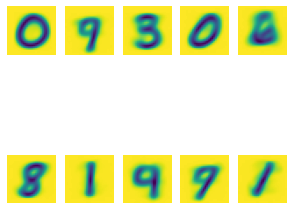

In [5]:
data_reader.plot_imgs(kmeans.centroids,len(kmeans.centroids))

Loss


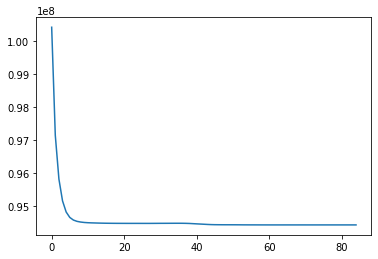

In [6]:
print('Loss')
plt.plot(range(kmeans.iterations),kmeans.loss_per_iteration)
plt.show()

Cluster: 0 Label: 0


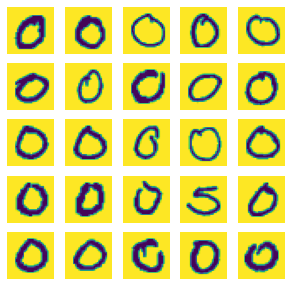

Cluster: 1 Label: 7


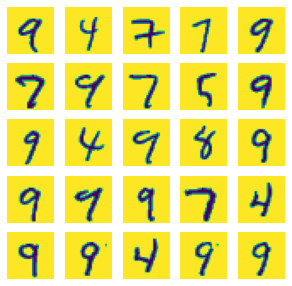

Cluster: 2 Label: 3


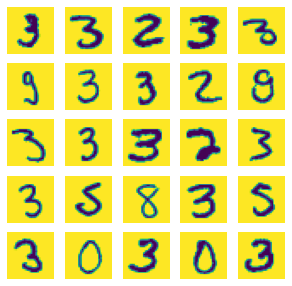

Cluster: 3 Label: 0


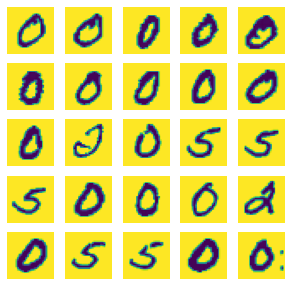

Cluster: 4 Label: 6


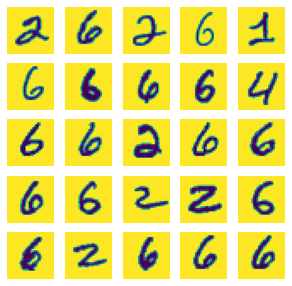

Cluster: 5 Label: 8


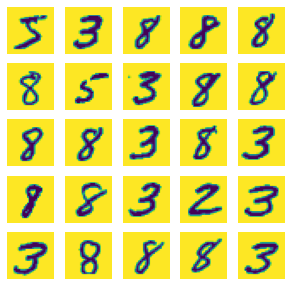

Cluster: 6 Label: 1


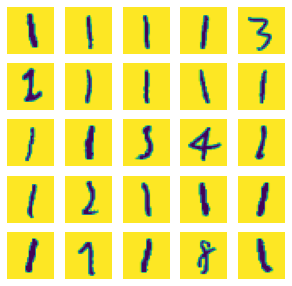

Cluster: 7 Label: 4


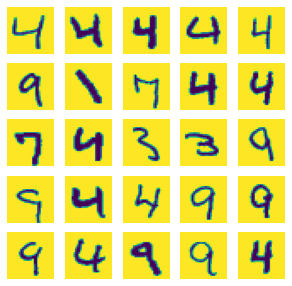

Cluster: 8 Label: 7


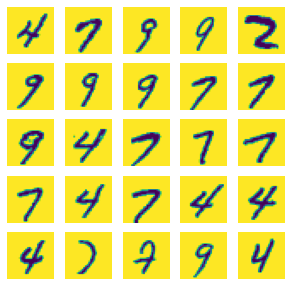

Cluster: 9 Label: 1


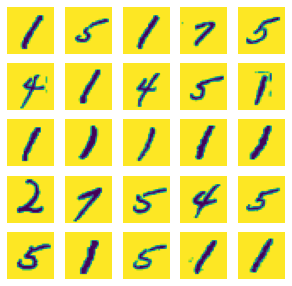

In [7]:
for key,data in list(kmeans.clusters['data'].items()):
    print('Cluster:',key,'Label:',kmeans.clusters_labels[key])
    data_reader.plot_imgs(data[:min(25,data.shape[0])],min(25,data.shape[0]))

In [8]:
print('[cluster_label,no_occurrence_of_label,total_samples_in_cluster,cluster_accuracy]\n',kmeans.clusters_info)
print('Accuracy:',kmeans.accuracy)

[cluster_label,no_occurrence_of_label,total_samples_in_cluster,cluster_accuracy]
 [[0, 2863, 3113, 0.91969161580469], [7, 2406, 6983, 0.34455105255620794], [3, 3961, 7770, 0.5097812097812098], [0, 2495, 3373, 0.7396975985769345], [6, 4921, 9336, 0.5270994001713796], [8, 3433, 6584, 0.5214155528554071], [1, 3739, 5576, 0.6705523672883787], [4, 2232, 5229, 0.4268502581755594], [7, 2703, 6551, 0.4126087620210655], [1, 2951, 5485, 0.5380127620783957]]
Accuracy: 0.5610260579309229


# PCA

Implementing this: https://github.com/wikiabhi/Cifar-10/blob/master/cifar10_pca.ipynb

## PCA Implementation

In [48]:
########################################################################

import numpy as np
import os

########################################################################


def one_hot_encoded(class_numbers, num_classes=None):
    """
    Generate the One-Hot encoded class-labels from an array of integers.
    For example, if class_number=2 and num_classes=4 then
    the one-hot encoded label is the float array: [0. 0. 1. 0.]
    :param class_numbers:
        Array of integers with class-numbers.
        Assume the integers are from zero to num_classes-1 inclusive.
    :param num_classes:
        Number of classes. If None then use max(class_numbers)+1.
    :return:
        2-dim array of shape: [len(class_numbers), num_classes]
    """

    # Find the number of classes if None is provided.
    # Assumes the lowest class-number is zero.
    if num_classes is None:
        num_classes = np.max(class_numbers) + 1

    return np.eye(num_classes, dtype=float)[class_numbers]


########################################################################


class DataSet:
    def __init__(self, in_dir, exts='.jpg'):
        """
        Create a data-set consisting of the filenames in the given directory
        and sub-dirs that match the given filename-extensions.
        For example, the knifey-spoony data-set (see knifey.py) has the
        following dir-structure:
        knifey-spoony/forky/
        knifey-spoony/knifey/
        knifey-spoony/spoony/
        knifey-spoony/forky/test/
        knifey-spoony/knifey/test/
        knifey-spoony/spoony/test/
        This means there are 3 classes called: forky, knifey, and spoony.
        If we set in_dir = "knifey-spoony/" and create a new DataSet-object
        then it will scan through these directories and create a training-set
        and test-set for each of these classes.
        The training-set will contain a list of all the *.jpg filenames
        in the following directories:
        knifey-spoony/forky/
        knifey-spoony/knifey/
        knifey-spoony/spoony/
        The test-set will contain a list of all the *.jpg filenames
        in the following directories:
        knifey-spoony/forky/test/
        knifey-spoony/knifey/test/
        knifey-spoony/spoony/test/
        See the TensorFlow Tutorial #09 for a usage example.
        :param in_dir:
            Root-dir for the files in the data-set.
            This would be 'knifey-spoony/' in the example above.
        :param exts:
            String or tuple of strings with valid filename-extensions.
            Not case-sensitive.
        :return:
            Object instance.
        """

        # Extend the input directory to the full path.
        in_dir = os.path.abspath(in_dir)

        # Input directory.
        self.in_dir = in_dir

        # Convert all file-extensions to lower-case.
        self.exts = tuple(ext.lower() for ext in exts)

        # Names for the classes.
        self.class_names = []

        # Filenames for all the files in the training-set.
        self.filenames = []

        # Filenames for all the files in the test-set.
        self.filenames_test = []

        # Class-number for each file in the training-set.
        self.class_numbers = []

        # Class-number for each file in the test-set.
        self.class_numbers_test = []

        # Total number of classes in the data-set.
        self.num_classes = 0

        # For all files/dirs in the input directory.
        for name in os.listdir(in_dir):
            # Full path for the file / dir.
            current_dir = os.path.join(in_dir, name)

            # If it is a directory.
            if os.path.isdir(current_dir):
                # Add the dir-name to the list of class-names.
                self.class_names.append(name)

                # Training-set.

                # Get all the valid filenames in the dir (not sub-dirs).
                filenames = self._get_filenames(current_dir)

                # Append them to the list of all filenames for the training-set.
                self.filenames.extend(filenames)

                # The class-number for this class.
                class_number = self.num_classes

                # Create an array of class-numbers.
                class_numbers = [class_number] * len(filenames)

                # Append them to the list of all class-numbers for the training-set.
                self.class_numbers.extend(class_numbers)

                # Test-set.

                # Get all the valid filenames in the sub-dir named 'test'.
                filenames_test = self._get_filenames(os.path.join(current_dir, 'test'))

                # Append them to the list of all filenames for the test-set.
                self.filenames_test.extend(filenames_test)

                # Create an array of class-numbers.
                class_numbers = [class_number] * len(filenames_test)

                # Append them to the list of all class-numbers for the test-set.
                self.class_numbers_test.extend(class_numbers)

                # Increase the total number of classes in the data-set.
                self.num_classes += 1

    def _get_filenames(self, dir):
        """
        Create and return a list of filenames with matching extensions in the given directory.
        :param dir:
            Directory to scan for files. Sub-dirs are not scanned.
        :return:
            List of filenames. Only filenames. Does not include the directory.
        """

        # Initialize empty list.
        filenames = []

        # If the directory exists.
        if os.path.exists(dir):
            # Get all the filenames with matching extensions.
            for filename in os.listdir(dir):
                if filename.lower().endswith(self.exts):
                    filenames.append(filename)

        return filenames

    def get_paths(self, test=False):
        """
        Get the full paths for the files in the data-set.
        :param test:
            Boolean. Return the paths for the test-set (True) or training-set (False).
        :return:
            Iterator with strings for the path-names.
        """

        if test:
            # Use the filenames and class-numbers for the test-set.
            filenames = self.filenames_test
            class_numbers = self.class_numbers_test

            # Sub-dir for test-set.
            test_dir = "test/"
        else:
            # Use the filenames and class-numbers for the training-set.
            filenames = self.filenames
            class_numbers = self.class_numbers

            # Don't use a sub-dir for test-set.
            test_dir = ""

        for filename, cls in zip(filenames, class_numbers):
            # Full path-name for the file.
            path = os.path.join(self.in_dir, self.class_names[cls], test_dir, filename)

            yield path

    def get_training_set(self):
        """
        Return the list of paths for the files in the training-set,
        and the list of class-numbers as integers,
        and the class-numbers as one-hot encoded arrays.
        """

        return list(self.get_paths()), \
               np.asarray(self.class_numbers), \
               one_hot_encoded(class_numbers=self.class_numbers,
                               num_classes=self.num_classes)

    def get_test_set(self):
        """
        Return the list of paths for the files in the test-set,
        and the list of class-numbers as integers,
        and the class-numbers as one-hot encoded arrays.
        """

        return list(self.get_paths(test=True)), \
               np.asarray(self.class_numbers_test), \
               one_hot_encoded(class_numbers=self.class_numbers_test,
                               num_classes=self.num_classes)


########################################################################


def load_cached(cache_path, in_dir):
    """
    Wrapper-function for creating a DataSet-object, which will be
    loaded from a cache-file if it already exists, otherwise a new
    object will be created and saved to the cache-file.
    This is useful if you need to ensure the ordering of the
    filenames is consistent every time you load the data-set,
    for example if you use the DataSet-object in combination
    with Transfer Values saved to another cache-file, see e.g.
    Tutorial #09 for an example of this.
    :param cache_path:
        File-path for the cache-file.
    :param in_dir:
        Root-dir for the files in the data-set.
        This is an argument for the DataSet-init function.
    :return:
        The DataSet-object.
    """

    print("Creating dataset from the files in: " + in_dir)

    # If the object-instance for DataSet(in_dir=data_dir) already
    # exists in the cache-file then reload it, otherwise create
    # an object instance and save it to the cache-file for next time.
    dataset = cache(cache_path=cache_path,
                    fn=DataSet, in_dir=in_dir)

    return dataset


########################################################################

In [49]:
########################################################################

import os
import pickle
import numpy as np

########################################################################


def cache(cache_path, fn, *args, **kwargs):
    """
    Cache-wrapper for a function or class. If the cache-file exists
    then the data is reloaded and returned, otherwise the function
    is called and the result is saved to cache. The fn-argument can
    also be a class instead, in which case an object-instance is
    created and saved to the cache-file.
    :param cache_path:
        File-path for the cache-file.
    :param fn:
        Function or class to be called.
    :param args:
        Arguments to the function or class-init.
    :param kwargs:
        Keyword arguments to the function or class-init.
    :return:
        The result of calling the function or creating the object-instance.
    """

    # If the cache-file exists.
    if os.path.exists(cache_path):
        # Load the cached data from the file.
        with open(cache_path, mode='rb') as file:
            obj = pickle.load(file)

        print("- Data loaded from cache-file: " + cache_path)
    else:
        # The cache-file does not exist.

        # Call the function / class-init with the supplied arguments.
        obj = fn(*args, **kwargs)

        # Save the data to a cache-file.
        with open(cache_path, mode='wb') as file:
            pickle.dump(obj, file)

        print("- Data saved to cache-file: " + cache_path)

    return obj


########################################################################


def convert_numpy2pickle(in_path, out_path):
    """
    Convert a numpy-file to pickle-file.
    The first version of the cache-function used numpy for saving the data.
    Instead of re-calculating all the data, you can just convert the
    cache-file using this function.
    :param in_path:
        Input file in numpy-format written using numpy.save().
    :param out_path:
        Output file written as a pickle-file.
    :return:
        Nothing.
    """

    # Load the data using numpy.
    data = np.load(in_path)

    # Save the data using pickle.
    with open(out_path, mode='wb') as file:
        pickle.dump(data, file)


########################################################################

if __name__ == '__main__':
    # This is a short example of using a cache-file.

    # This is the function that will only get called if the result
    # is not already saved in the cache-file. This would normally
    # be a function that takes a long time to compute, or if you
    # need persistent data for some other reason.
    def expensive_function(a, b):
        return a * b

    print('Computing expensive_function() ...')

    # Either load the result from a cache-file if it already exists,
    # otherwise calculate expensive_function(a=123, b=456) and
    # save the result to the cache-file for next time.
    result = cache(cache_path='cache_expensive_function.pkl',
                   fn=expensive_function, a=123, b=456)

    print('result =', result)

    # Newline.
    print()

    # This is another example which saves an object to a cache-file.

    # We want to cache an object-instance of this class.
    # The motivation is to do an expensive computation only once,
    # or if we need to persist the data for some other reason.
    class ExpensiveClass:
        def __init__(self, c, d):
            self.c = c
            self.d = d
            self.result = c * d

        def print_result(self):
            print('c =', self.c)
            print('d =', self.d)
            print('result = c * d =', self.result)

    print('Creating object from ExpensiveClass() ...')

    # Either load the object from a cache-file if it already exists,
    # otherwise make an object-instance ExpensiveClass(c=123, d=456)
    # and save the object to the cache-file for the next time.
    obj = cache(cache_path='cache_ExpensiveClass.pkl',
                fn=ExpensiveClass, c=123, d=456)

    obj.print_result()

########################################################################

Computing expensive_function() ...
- Data loaded from cache-file: cache_expensive_function.pkl
result = 56088

Creating object from ExpensiveClass() ...
- Data loaded from cache-file: cache_ExpensiveClass.pkl
c = 123
d = 456
result = c * d = 56088


In [50]:
########################################################################

import sys
import os
import urllib.request
import tarfile
import zipfile

########################################################################


def _print_download_progress(count, block_size, total_size):
    """
    Function used for printing the download progress.
    Used as a call-back function in maybe_download_and_extract().
    """

    # Percentage completion.
    pct_complete = float(count * block_size) / total_size

    # Status-message. Note the \r which means the line should overwrite itself.
    msg = "\r- Download progress: {0:.1%}".format(pct_complete)

    # Print it.
    sys.stdout.write(msg)
    sys.stdout.flush()


########################################################################


def maybe_download_and_extract(url, download_dir):
    """
    Download and extract the data if it doesn't already exist.
    Assumes the url is a tar-ball file.
    :param url:
        Internet URL for the tar-file to download.
        Example: "https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz"
    :param download_dir:
        Directory where the downloaded file is saved.
        Example: "data/CIFAR-10/"
    :return:
        Nothing.
    """

    # Filename for saving the file downloaded from the internet.
    # Use the filename from the URL and add it to the download_dir.
    filename = url.split('/')[-1]
    file_path = os.path.join(download_dir, filename)

    # Check if the file already exists.
    # If it exists then we assume it has also been extracted,
    # otherwise we need to download and extract it now.
    if not os.path.exists(file_path):
        # Check if the download directory exists, otherwise create it.
        if not os.path.exists(download_dir):
            os.makedirs(download_dir)

        # Download the file from the internet.
        file_path, _ = urllib.request.urlretrieve(url=url,
                                                filename=file_path,
                                                reporthook=_print_download_progress)

        print()
        print("Download finished. Extracting files.")

        if file_path.endswith(".zip"):
            # Unpack the zip-file.
            zipfile.ZipFile(file=file_path, mode="r").extractall(download_dir)
        elif file_path.endswith((".tar.gz", ".tgz")):
            # Unpack the tar-ball.
            tarfile.open(name=file_path, mode="r:gz").extractall(download_dir)

        print("Done.")
    else:
        print("Data has apparently already been downloaded and unpacked.")


########################################################################

In [51]:

########################################################################
#
# This file is part of the TensorFlow Tutorials available at:
#
# https://github.com/Hvass-Labs/TensorFlow-Tutorials
#
# Published under the MIT License. See the file LICENSE for details.
#
# Copyright 2016 by Magnus Erik Hvass Pedersen
#
########################################################################

import numpy as np
import pickle
import os

########################################################################

# Directory where you want to download and save the data-set.
# Set this before you start calling any of the functions below.
data_path = "data/CIFAR-10/"

# URL for the data-set on the internet.
data_url = "https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz"

########################################################################
# Various constants for the size of the images.
# Use these constants in your own program.

# Width and height of each image.
img_size = 32

# Number of channels in each image, 3 channels: Red, Green, Blue.
num_channels = 3

# Length of an image when flattened to a 1-dim array.
img_size_flat = img_size * img_size * num_channels

# Number of classes.
num_classes = 10

########################################################################
# Various constants used to allocate arrays of the correct size.

# Number of files for the training-set.
_num_files_train = 5

# Number of images for each batch-file in the training-set.
_images_per_file = 10000

# Total number of images in the training-set.
# This is used to pre-allocate arrays for efficiency.
_num_images_train = _num_files_train * _images_per_file

########################################################################
# Private functions for downloading, unpacking and loading data-files.



def _get_file_path(filename=""):
    """
    Return the full path of a data-file for the data-set.
    If filename=="" then return the directory of the files.
    """

    return os.path.join(data_path, "cifar-10-batches-py/", filename)


def _unpickle(filename):
    """
    Unpickle the given file and return the data.
    Note that the appropriate dir-name is prepended the filename.
    """

    # Create full path for the file.
    file_path = _get_file_path(filename)

    print("Loading data: " + file_path)

    with open(file_path, mode='rb') as file:
        # In Python 3.X it is important to set the encoding,
        # otherwise an exception is raised here.
        data = pickle.load(file,  encoding='latin1')

    return data


def _convert_images(raw):
    """
    Convert images from the CIFAR-10 format and
    return a 4-dim array with shape: [image_number, height, width, channel]
    where the pixels are floats between 0.0 and 1.0.
    """

    # Convert the raw images from the data-files to floating-points.
    raw_float = np.array(raw, dtype=float) / 255.0

    # Reshape the array to 4-dimensions.
    images = raw_float.reshape([-1, num_channels, img_size, img_size])

    # Reorder the indices of the array.
    images = images.transpose([0, 2, 3, 1])

    return images


def _load_data(filename):
    """
    Load a pickled data-file from the CIFAR-10 data-set
    and return the converted images (see above) and the class-number
    for each image.
    """

    # Load the pickled data-file.
    data = _unpickle(filename)

    # Get the raw images.
    raw_images = data['data']

    # Get the class-numbers for each image. Convert to numpy-array.
    cls = np.array(data['labels'])

    # Convert the images.
    images = _convert_images(raw_images)

    return images, cls


########################################################################
# Public functions that you may call to download the data-set from
# the internet and load the data into memory.


def maybe_download_and_extract():
    """
    Download and extract the CIFAR-10 data-set if it doesn't already exist
    in data_path (set this variable first to the desired path).
    """

    download.maybe_download_and_extract(url=data_url, download_dir=data_path)


def load_class_names():
    """
    Load the names for the classes in the CIFAR-10 data-set.
    Returns a list with the names. Example: names[3] is the name
    associated with class-number 3.
    """

    # Load the class-names from the pickled file.
    raw = _unpickle(filename="batches.meta")['label_names']

    # Convert from binary strings.
    return raw


def load_training_data():
    """
    Load all the training-data for the CIFAR-10 data-set.
    The data-set is split into 5 data-files which are merged here.
    Returns the images, class-numbers and one-hot encoded class-labels.
    """

    # Pre-allocate the arrays for the images and class-numbers for efficiency.
    images = np.zeros(shape=[_num_images_train, img_size, img_size, num_channels], dtype=float)
    cls = np.zeros(shape=[_num_images_train], dtype=int)

    # Begin-index for the current batch.
    begin = 0

    # For each data-file.
    for i in range(_num_files_train):
        # Load the images and class-numbers from the data-file.
        images_batch, cls_batch = _load_data(filename="data_batch_" + str(i + 1))

        # Number of images in this batch.
        num_images = len(images_batch)

        # End-index for the current batch.
        end = begin + num_images

        # Store the images into the array.
        images[begin:end, :] = images_batch

        # Store the class-numbers into the array.
        cls[begin:end] = cls_batch

        # The begin-index for the next batch is the current end-index.
        begin = end

    return images, cls, one_hot_encoded(class_numbers=cls, num_classes=num_classes)


def load_test_data():
    """
    Load all the test-data for the CIFAR-10 data-set.
    Returns the images, class-numbers and one-hot encoded class-labels.
    """

    images, cls = _load_data(filename="test_batch")

    return images, cls, one_hot_encoded(class_numbers=cls, num_classes=num_classes)

########################################################################

In [52]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA

from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

In [53]:
cifar10.data_path = "data/CIFAR-10/"
cifar10.maybe_download_and_extract()
class_names = cifar10.load_class_names()
class_names

- Download progress: 100.0%
Download finished. Extracting files.
Done.
Loading data: data/CIFAR-10/cifar-10-batches-py/batches.meta


['airplane',
 'automobile',
 'bird',
 'cat',
 'deer',
 'dog',
 'frog',
 'horse',
 'ship',
 'truck']

In [54]:
images_train, cls_train, labels_train = cifar10.load_training_data()
images_test, cls_test, labels_test = cifar10.load_test_data()

## It represents the RGB values of the pixel(12,22) of 5th image in training dataset 
images_train[5][12][22]
images_train.shape
images_test.shape

x_train = images_train.reshape(images_train.shape[0],-1)
x_test = images_test.reshape(images_test.shape[0], -1)
x_train.shape
x_test.shape

y_train = cls_train
y_test = cls_test

Loading data: data/CIFAR-10/cifar-10-batches-py/data_batch_1
Loading data: data/CIFAR-10/cifar-10-batches-py/data_batch_2
Loading data: data/CIFAR-10/cifar-10-batches-py/data_batch_3
Loading data: data/CIFAR-10/cifar-10-batches-py/data_batch_4
Loading data: data/CIFAR-10/cifar-10-batches-py/data_batch_5
Loading data: data/CIFAR-10/cifar-10-batches-py/test_batch


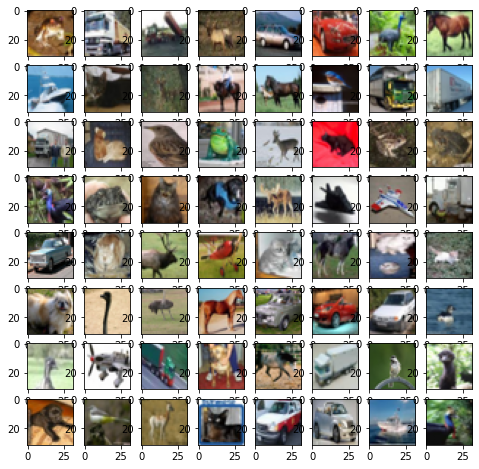

In [55]:
# plotting first 64 images
fig = plt.figure(figsize=(8,8))

for i in range(64):
    ax = fig.add_subplot(8, 8, i+1)
    ax.imshow(images_train[i], cmap = plt.cm.bone)
plt.show()

In [56]:
pca = PCA()
pca.fit_transform(x_train)

array([[-6.40101763e+00,  2.72903876e+00,  1.50171052e+00, ...,
        -7.62287826e-04, -1.16359323e-03, -3.49768400e-04],
       [ 8.29783385e-01, -9.49943219e-01,  6.00375260e+00, ...,
         1.08434589e-04,  5.76715387e-04, -7.71005927e-04],
       [ 7.73019978e+00, -1.15221023e+01, -2.75362051e+00, ...,
        -1.04460109e-03, -2.14105740e-04, -3.93469526e-04],
       ...,
       [ 7.07346587e-01, -1.13425212e+01, -3.93914878e-01, ...,
        -3.80341568e-04,  1.86432348e-03,  1.44785229e-03],
       [ 1.13679090e+01, -3.37597765e+00,  5.56619766e+00, ...,
        -4.67096832e-04,  7.44972963e-04, -1.67065056e-03],
       [ 4.19279645e+00, -1.18418848e+00, -4.44596297e+00, ...,
         9.67968258e-04,  2.40363971e-04, -2.80506224e-05]])

In [57]:
pca.explained_variance_.shape

(3072,)

In [58]:
# Calculating optimal k to have 95% (say) variance 

k = 0
total = sum(pca.explained_variance_)
current_sum = 0

while(current_sum / total < 0.99):
    current_sum += pca.explained_variance_[k]
    k += 1
k

658

In [59]:
## Applying PCA with k calcuated above

pca = PCA(n_components=k, whiten=True)

x_train_pca = pca.fit_transform(x_train)
x_test_pca = pca.transform(x_test)

Random Forest

In [60]:
## Training
rf = RandomForestClassifier()
rf.fit(x_train_pca, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [61]:
## Predicting
y_pred_rf = rf.predict(x_test_pca)

random_forest_score = accuracy_score(y_test, y_pred_rf)
random_forest_score

0.3873

KNN

In [62]:
## Training 
knn = KNeighborsClassifier()
knn.fit(x_train_pca, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [63]:
## Predicting
y_pred_knn = knn.predict(x_test_pca)

knn_score = accuracy_score(y_test, y_pred_knn)
knn_score

0.1415

Logistic Regression

In [64]:
## Training 
lr = LogisticRegression()
lr.fit(x_train_pca, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [65]:
## Predicting
y_pred_lr = lr.predict(x_test_pca)
logistic_regression_score = accuracy_score(y_test, y_pred_lr)
logistic_regression_score

0.4022

SVM

In [ ]:
## Training
svc = svm.SVC()
svc.fit(x_train_pca, y_train)

In [ ]:
## Predicting 
y_pred_svm = svc.predict(x_test_pca)
svc_score = accuracy_score(y_test, y_pred_svm)
svc_score

Comparison

In [ ]:
print("RandomForestClassifier : ", random_forest_score)
print("K Nearest Neighbors : ", knn_score)
print("Logistic Regression : ", logistic_regression_score)
print("Support Vector Classifier : ", svc_score)

## Linear

Tutorial From Here: https://www.cs.virginia.edu/~vicente/recognition/notebooks/linear_classifier_sgd_lab.html

In [ ]:
import torch, torchvision, PIL
from torchvision.datasets import CIFAR10 
from PIL import Image
import numpy as np
from io import BytesIO
import torchvision.transforms as transforms
import IPython.display
%load_ext autoreload
%autoreload 2

classes = ['airplane', 'automobile', 'bird', 'cat', 'deer',
           'dog', 'frog', 'horse', 'ship', 'truck']
class2id = {name: idx for (idx, name) in enumerate(classes)}
trainset = CIFAR10(root='./data', train = True, download = True)

# Datasets need to implement the __len__ method.
print('\nThe training data has %d samples' % len(trainset))


In [ ]:


imgTransform = transforms.Compose([
    transforms.ToTensor()
])

trainset = CIFAR10(root='./data', train = True, transform = imgTransform)
valset = CIFAR10(root='./data', train = False, transform = imgTransform)

# Softmax function: exp(a) / sum(exp(a))
# Note that this function works for tensors of any shape, it is not a scalar function.
def softmax(a):
    max_val = a.max()  # This is to avoid variable overflows.
    exp_a = (a - max_val).exp()
    return exp_a.div(exp_a.sum())

# Classification function: y = softmax(Wx + b)
# Again, note this function is operating on vectors.
def linear(x, weight, bias):
    return torch.matmul(weight, x) + bias

# Initialize bias and weight with random values.
weight = torch.Tensor(10, 3 * 32 * 32).normal_(0, 0.01)
bias = torch.Tensor(10, 1).normal_(0, 0.01)

# Now predict the category using this un-trained classifier.
img, _ = trainset[0]
x = img.view(3 * 32 * 32, 1)
a = linear(x, weight, bias)
predictions = softmax(a)

In [ ]:
def loss(label, predictions):
    return -predictions[label].log()

# Let's compute predictions again.
predictions = softmax(linear(x, weight, bias))

for (i, pred) in enumerate(predictions.squeeze().tolist()):
    print('y_hat[%s] = %.2f' % (classes[i], pred))

# The correct label for this image is 'frog'.
loss_value = loss(class2id['frog'], predictions)
print('\nLoss: %.2f' % loss_value[0])

In [ ]:
epsilon = 0.0001
shifted_weight = weight.clone()  # Make a copy of the weights.

# Initialize gradients for bias and weight with zero values.
gradWeight = torch.Tensor(10, 3 * 32 * 32).fill_(0)
gradBias = torch.Tensor(10, 1).fill_(0)

# Compute gradients for each weight w_ij
for i in range(0, weight.shape[0]):
    for j in range(0, weight.shape[1]):
        # Compute f(x + h)
        shifted_weight[i, j] = shifted_weight[i, j] + epsilon
        f1 = softmax(linear(x, shifted_weight, bias))
        loss1 = loss(class2id['frog'], f1)
        shifted_weight[i, j] = weight[i, j] # restore original value.
        
        # Compute f(x - h)
        shifted_weight[i, j] = shifted_weight[i, j] - epsilon
        f2 = softmax(linear(x, shifted_weight, bias))
        loss2 = loss(class2id['frog'], f2)
        shifted_weight[i, j] = weight[i, j] # restore original value.

        # Compute [f(x + h) - f(x - h)] / 2h.
        gradWeight[i, j] = (loss1[0] - loss2[0]) / (2 * epsilon)

numericalGradWeight = gradWeight # Let's save this variable with another name.
print(numericalGradWeight)

In [ ]:
def loss_softmax_backward(label, predictions):
    grad_inputs = predictions.clone()
    grad_inputs[label] = grad_inputs[label] - 1
    return grad_inputs

def linear_backward(x, weight, bias, gradOutput):
    gradBias = bias.clone().zero_()
    gradWeight = weight.clone().zero_()
    gradWeight = gradOutput * x.t()
    gradBias.copy_(gradOutput)
    return gradWeight, gradBias

gradOutput = loss_softmax_backward(class2id['frog'], predictions)
gradWeight, gradBias = linear_backward(x, weight, bias, gradOutput)

# Let's print the gradWeight again.
print(gradWeight)

g1 = gradWeight.view(-1, 1).squeeze()
g2 = numericalGradWeight.view(-1, 1).squeeze()
print('Distance betwen numerical and analytical gradients: %.6f' % 
      (torch.norm(g1 - g2) / torch.norm(g1 + g2)))

In [ ]:
# Define a learning rate. This is what I found worked but did not try exahustively.
learningRates = [1e-4, 1e-5]
weightDecay = 1e-6 # Regularization strength.

# Initialize bias and weight with random values again.
weight = torch.Tensor(10, 3 * 32 * 32).normal_(0, 0.01)
bias = torch.Tensor(10, 1).zero_()

# Training loop. Please make sure you understand every single line of code below.
# Go back to some of the previous steps in this lab if necessary.
for epoch in range(0, 5):
    correct = 0.0
    cum_loss = 0.0
    learningRate = learningRates[0] if epoch < 5 else learningRates[1]
    
    # Make a pass over the training data.
    for (i, (img, label)) in enumerate(trainset):
        x = img.view(3 * 32 * 32, 1)
        
        # Forward pass. (Prediction stage)
        predictions = softmax(linear(x, weight, bias))
        cum_loss += loss(label, predictions)[0]
        max_score, max_label = predictions.max(0)
        if max_label[0] == label: correct += 1
        
        #Backward pass. (Gradient computation stage)
        gradOutput = loss_softmax_backward(label, predictions)
        gradWeight, gradBias = linear_backward(x, weight, bias, gradOutput)
        
        # Parameter updates.
        gradWeight.add_(weightDecay, weight)
        weight.add_(-learningRate, gradWeight)
        #bias = bias - learningRate * gradBias
        
        # Logging the current results on training.
        if (i + 1) % 10000 == 0:
            print('Train-epoch %d. Iteration %05d, Avg-Loss: %.4f, Accuracy: %.4f' % 
                  (epoch, i + 1, cum_loss / (i + 1), correct / (i + 1)))
    
    
    # Make a pass over the validation data.
    correct = 0.0
    cum_loss = 0.0
    for (i, (img, label)) in enumerate(valset):
        x = img.view(3 * 32 * 32, 1)
        
        # Forward pass. (Prediction stage)
        predictions = softmax(linear(x, weight, bias))
        cum_loss += loss(label, predictions)[0]
        max_score, max_label = predictions.max(0)
        if max_label[0] == label: correct += 1
            
    # Logging the current results on validation.
    print('Validation-epoch %d. Avg-Loss: %.4f, Accuracy: %.4f' % 
          (epoch, cum_loss / len(valset), correct / len(valset)))

In [ ]:
# Now predict the category using this trained classifier!.
img, _ = trainset[7]
x = img.view(3 * 32 * 32, 1)
a = linear(x, weight, bias)
predictions = softmax(a)

# Print out detailed predictions.
for (i, pred) in enumerate(predictions.squeeze().tolist()):
    print('y_hat[%s] = %.2f' % (classes[i], pred))